# Data Science Immersive Capstone - Solar Energy Prediction
### Jeff Patra

## Executive Summary

Solar energy is becoming increasingly more popular as a renewable energy source.  It offers many environmental advantages; however fluctuations with changing weather patterns have always been a problem.  While solar may not entirely replace fossil fuels it has its place in the power generation portfolio.  Many electricity companies are looking to add solar energy into the mix of power generation and in order to do so they require accurate solar production forecasts.  Errors in forecasting could lead to large expenses like excess fuel consumption or emergency purchases of electricity from neighboring utilities.   Power forecasts are typically derived from numerical weather prediction models, but statistical and machine learning techniques are increasingly being used in conjunction with the numerical models to produce more accurate forecasts. 

For my capstone I am going to predict solar energy across Oklahoma State using weather forecast data as my inputs.  The prediciton will be trained and tested against the solar energy produced at 98 weather stations across the state over a fourteen year time period 1994-2007.

A detailed report has been submitted in pages format:
JPatra_Final_Capstone_Report.pages

Check out my blog post here:
https://wordpress.com/post/jeffgeneralassemblyblog.wordpress.com


### Objective

Create a model that predicts solar energy using forecast data as inputs (i.e temperature, pressure, humidity, etc).

### How could this be used and why is this important?

Solar forecasting is an important component in forecasting electricity generation for solar devices. It is becoming of increasing importance as solar power becomes a viable renewable power source.

Potential end users of my solar prediciton model could be government agencies and solar energy companies. Solar energy prediciton could be used to optimize the placement of solar farms in order to maximize power generation.  



### Data Description

This study was initially completed as a kaggle contest in 2013-14.  I will use the data provided from this contest to create my own results.  

The forecast data are in netCDF4 format. The netCDF4 files provided are multi-dimensional array data in both space and time. Example below:

            Lat
         33  34  35  36
     254  x   x   x   x
Long 255  x   x   x   x

Where at each specific latitude and longitude exisits a multi-dimensional array of multiple models in time. 
To simplify I averaged all the models to create a one dimensional array.

Data Description from Kaggle 
Each netCDF4 file contains the total data for one of the model variables and are stored in a multidimensional array. The first dimension is the date of the model run and will correspond directly with a row in either the train.csv or sampleSubmission.csv files. The second dimension is the ensemble member that the forecast comes from. The GEFS has 11 ensemble members with perturbed initial conditions. The third dimension is the forecast hour, which runs from 12 to 24 hours in 3 hour increments. All model runs start at 00 UTC, so they will always correspond to the same universal time although local solar time will vary over each year. The fourth and fifth dimensions are the latitude and longitude uniform spatial grid. The longitudes in the file are in positive degrees from the Prime Meridian, so subtracting 360 from them will translate them to a similar range of values as in station_info.csv. A visualization of the grid can be seen on the main page.

### Proposed Method and Model

Essentially there were two data sets:
1. Global forecast information consisting of 15 netCDF4 files.  Each file contains a specific forecast element (i.e temperature, pressure, precipitation,etc) at a given latitude and longitude over a fourteen year period from 1994 - 2007 where the step rate is in days.
2. The second data set consists of calculated solar energy acquired from 98 weather stations (mesonets) during the same fourteen year period. 

First step is to figure out how to load the forecast data and get it into a useable format. The major challenge was getting around the multiple dimensions and choosing which model forecast to use.  I was able to get the data sorted by latitude and longitude but then struggled to get each netcdf4 into time series. It was then I realized that the length of the netcdf4 files were the same as the target set. This made life so much easier since we didn't have to re-size any arrays.

Once all the features are loded we can run a solar prediction model. My plan is to ry and few different regressors and choose the one that is the most robust and provides the best results.  Once I have a tuned model the plan is to propgate through the entire data set.

## Load and Extract Forecast Data into a Useable Format

In [6]:
#This notebook and code was written in Python 2.7

#As a start let's import the following modules

import numpy as np
import netCDF4 as nc #to view .nc files we need this module
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
#Start by loading one feature to see what we have.  
#Will use pressure as the test file to view and setup the workflow
press_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/pres_msl_latlon_subset_19940101_20071231.nc') 
print press_nc

#Below tells us the location grid, time, dimensions and variables

<type 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.0
    title: Subset of data from 2nd-generation multi-decadal ensemble reforecast generated from the NCEP Global Ensemble Forecast System, mimicking version operational at NCEP/EMC circa mid-2012.
    institution: NOAA Earth System Research Laboratory (ESRL)
    source: NCEP GFS v 9.01, T254L42.  Control initial conditions from CFSRR.  Perturbed initial conditions from ETR.  Model error simulated with STTP.
    references: http://www.esrl.noaa.gov/psd/forecasts/reforecast2/index.html
    history: Subset created 2013-01-15 19:17:02 UTC
    comment: Original dataset generated on DOE's supercomputers at Lawrence Berkeley Laboratory through ALCC/ASCR grant.
    dimensions(sizes): time(5113), lat(9), lon(16), ens(11), fhour(5)
    variables(dimensions): float64 time(time), int32 intTime(time), float32 lat(lat), float32 lon(lon), int16 ens(ens), int32 fhour(fhour), int32 intValidTime(ti

### Comment
After doing so research I found that someone has nicely explained the structure of a netCDf4 file

Credit Zygmunt Z.
http://fastml.com/predicting-solar-energy-from-weather-forecasts-plus-a-netcdf4-tutorial/

NetCDF dataset contains variables, modeled as an OrderedDict in Python. 
This data structure is a cross between a dictionary and a list, 
meaning that you can access elements both by name and by index.

In [12]:
#For this solar prediction study the two elements of interest are the dimensions and variables.

#Let's look at the categories
print 'Dimensions'
for v in press_nc.dimensions.keys():
	print v
print ''
print 'Varaiables'
for v in press_nc.variables.keys():
	print v
    
#Notice the last variable in Variables is the main item of iterest.  In this case it's Pressure

Dimensions
time
lat
lon
ens
fhour

Varaiables
time
intTime
lat
lon
ens
fhour
intValidTime
Pressure


In [21]:
#Let's look at the latitudes and extract values from this format into something more useable
lat = press_nc.variables['lat']
print lat.shape #output tells us how may

lon = press_nc.variables['lon']
print lon.shape

l = lat[:]

#The longitudes in the file are in positive degrees from the Prime Meridian, so subtracting 360 
#n=lon[:]-360
#Rather than convert all feature data we will convert longitude in the station.csv by adding 360 to the longitude
n=lon[:]
print 'latitude'
print l
print ''
print 'longitude'
print n

(9,)
(16,)
latitude
[ 31.  32.  33.  34.  35.  36.  37.  38.  39.]

longitude
[ 254.  255.  256.  257.  258.  259.  260.  261.  262.  263.  264.  265.
  266.  267.  268.  269.]


In [22]:
#Let's grab that variable and look at the shape
press = press_nc.variables.values()[-1]
print press.dimensions
print press.shape
#print 'days, models, hours, lat dimension, longitude dimension

#Let's grab that variable and look at the shape
pressure = press_nc.variables.values()[-1]

(u'time', u'ens', u'fhour', u'lat', u'lon')
(5113, 11, 5, 9, 16)


In [23]:
#Let's have a look at the time
intTime = press_nc.variables['intTime']
print intTime
#print time.shape #output tells us how may
list(intTime[:10])

#This is good because it tells us that the length of this array is in the same increment as our weater station data.

<type 'netCDF4._netCDF4.Variable'>
int32 intTime(time)
    long_name: time as an integer (YYYYMMDDHH)
unlimited dimensions: 
current shape = (5113,)
filling on, default _FillValue of -2147483647 used



[1994010100,
 1994010200,
 1994010300,
 1994010400,
 1994010500,
 1994010600,
 1994010700,
 1994010800,
 1994010900,
 1994011000]

### Comment
Above we can see the range of our latitude and longitude grid.  Note that the longitude is a positive number.  In order to get this into a Longitude that we normally recognize we need to subtract 360 degrees. For now we will keep it as is.

All feature data is in the same format and same length so we can assume the same grid dimensions and setup.

### Data Extraction
Now that we have found a way to load and view the data we need to figure out how to get it into a usable format.  All our data is tied by latitude and longitide.  So the method I am going to use is dictionaries.  My plan is to extract each feature and convert it to a dictionary.  Then match up the weather station lat/lon to the nearest lat/lon in our forecast data.  Once I have the features for each location we can proceed to predict solar energy.

In [831]:
#Determine the length of the latitude and longitude lists
lat_len = list(range(len(lat)))
lon_len = list(range(len(lon)))
print lat_len
print lon_len

[0, 1, 2, 3, 4, 5, 6, 7, 8]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


In [26]:
#This box converts the feature (pressure) into a dictionary. Once I got this working 
#I used this to create a function to pass all features through

#Let's grab that variable and look at the shape
pressure = press_nc.variables.values()[-1]

#Create output lists and dictionaries
lat_lon =[]
p_list =[]
press_dict = {}

for l in list(range(len(lat))): #Length of latitude array    
	for n in list(range(len(lon))): #Length of longitude array    
        
		lat_lon.append(np.column_stack((lat[l],lon[n])))

		temp = list(pressure[:,:,:,l,n])
		pcp = np.median(temp, axis=1) #Outputs median of the five models
		#pcp = np.column_stack((t,pcp)) #This adds the time column. Not working.

		#pcp_av = np.median(pcp,axis=1).tolist() #Outputs the median of the median as values
		pcp_av = np.median(pcp,axis=1) #Outputs the median of the median
		#pcp_av = np.column_stack((t,pcp_av)) #This adds the time column. Not working.

        #This converts to csv if required
		#np.savetxt('pcp_'+str(int(lat[l]))+'_'+str(int(lon[n]))+'.csv', pcp, delimiter = ",", fmt = "%.06f" )
		#np.savetxt('pcp_av_'+str(int(lat[l]))+'_'+str(int(lon[n]))+'.csv', pcp_av, delimiter = ",", fmt = "%.06f" )

		p_list.append([[int(lat[l]),int(lon[n])],pcp_av])

#Create data dictionary for precipitation where the key is lat/long and value is the pressure over time
for n in range(len(p_list)):
	k = tuple(p_list[n][0])
	#key = tuple(key)
	v = p_list[n][1]
	press_dict[k] = [v]

print press_dict


{(37, 255): [array([ 101919.890625 ,  102467.65625  ,  101724.6796875, ...,
        102097.46875  ,  101877.671875 ,  102865.2890625], dtype=float32)], (32, 269): [array([ 101959.3125   ,  101516.2421875,  101111.078125 , ...,
        102274.75     ,  101765.4140625,  101856.1875   ], dtype=float32)], (35, 264): [array([ 101960.09375  ,  101254.796875 ,  102060.5234375, ...,
        102341.71875  ,  101752.3125   ,  102114.40625  ], dtype=float32)], (34, 256): [array([ 102354.1796875,  101977.421875 ,  101718.890625 , ...,
        101957.6328125,  101805.953125 ,  102514.8828125], dtype=float32)], (33, 264): [array([ 101943.953125 ,  101240.3984375,  102005.       , ...,
        102307.109375 ,  101732.328125 ,  102096.7421875], dtype=float32)], (31, 269): [array([ 101950.640625 ,  101552.5625   ,  101148.328125 , ...,
        102192.0703125,  101769.015625 ,  101892.7890625], dtype=float32)], (36, 259): [array([ 102214.0390625,  101696.140625 ,  101679.53125  , ...,
        102096.828

In [29]:
#Function that converts netcdf4 to dictionary where key is lat/lon and value is array information in time


def netcdf4_to_dict(data_nc):
    import timeit
    start = timeit.default_timer()
    data = data_nc.variables.values()[-1]
    c_list=[]
    c_dict={}

    for l in lat_len:
        for n in lon_len:
            lat_lon.append(np.column_stack((lat[l],lon[n])))

    
            temp = list(data[:,:,:,l,n])
            pcp = np.median(temp, axis=1) #Outputs median of the five models
            #pcp = np.column_stack((t,pcp)) #This adds the time column

            #pcp_av = np.median(pcp,axis=1).tolist() #Outputs the median of the median as values
            pcp_av = np.median(pcp,axis=1) #Outputs the median of the median
            #pcp_av = np.column_stack((t,pcp_av)) #This adds the time column

            c_list.append([[int(lat[l]),int(lon[n])],pcp_av])

    
    # key: is location in latitude and longitude
    #value: is the feature over time incremented in days
    for n in range(len(c_list)):
        k = tuple(c_list[n][0])
        v = c_list[n][1]
        c_dict[k] = [v]
    stop = timeit.default_timer()
    print "Time: %d s" % (stop - start)
    return c_dict


In [30]:
#Test the function on the Pressure feature.
Press_dict = netcdf4_to_dict(press_nc)

#It worked and took 17s.

Time: 17 s


In [116]:
#check output.
#With this function we can now load the remaining features quite pretty easily.
#We have 15 features so loading should take ~4.5 minutes
Press_dict

{(31, 254): [array([ 102256.7578125,  102208.4296875,  102262.671875 , ...,
          101918.296875 ,  102299.7734375,  102073.953125 ], dtype=float32)],
 (31, 255): [array([ 102279.1796875,  102135.71875  ,  102141.5      , ...,
          101835.2265625,  102193.7734375,  102115.3671875], dtype=float32)],
 (31, 256): [array([ 102214.703125 ,  101971.4609375,  101995.578125 , ...,
          101755.546875 ,  102021.171875 ,  102072.6484375], dtype=float32)],
 (31, 257): [array([ 102185.1015625,  101814.1796875,  102001.28125  , ...,
          101791.2734375,  101998.1484375,  102110.40625  ], dtype=float32)],
 (31,
  258): [array([ 102158.09375,  101670.5    ,  102100.84375, ...,  101895.15625,
          102004.3125 ,  102176.8125 ], dtype=float32)],
 (31, 259): [array([ 102094.40625  ,  101571.7734375,  102192.84375  , ...,
          101951.796875 ,  101999.1484375,  102249.7734375], dtype=float32)],
 (31, 260): [array([ 102017.2890625,  101518.328125 ,  102233.8203125, ...,
          

## Features to load

Features	Description	Units
1.  apcp_sfc	3-Hour accumulated precipitation at the surface	kg m-2
2.  dlwrf_sfc	Downward long-wave radiative flux average at the surface	W m-2
3.  dswrf_sfc	Downward short-wave radiative flux average at the surface	W m-2
4.  pres_msl	Air pressure at mean sea level	Pa
5.  pwat_eatm	Precipitable Water over the entire depth of the atmosphere	kg m-2
6.  spfh_2m	    Specific Humidity at 2 m above ground	kg kg-1
7.  tcdc_eatm	Total cloud cover over the entire depth of the atmosphere	 %
8.  tcolc_eatm	Total column-integrated condensate over the entire atmos.	kg m-2
9.  tmax_2m 	Maximum Temperature over the past 3 hours at 2 m above the ground	 K
10. tmin_2m	    Mininmum Temperature over the past 3 hours at 2 m above the ground	 K
11. tmp_2m	    Current temperature at 2 m above the ground	 K
12. tmp_sfc	    Temperature of the surface	 K
13. ulwrf_sfc	Upward long-wave radiation at the surface	 W m-2
14. ulwrf_tatm	Upward long-wave radiation at the top of the atmosphere	 W m-2
15. uswrf_sfc	Upward short-wave radiation at the surface	 W m-2

Looking at the current input set of features it is likely that we will be able to apply some sort of dimensionality reduction through PCA.  But for now we will load all the features so that we can understand which ones are contributing the most.

In [31]:
#Use function to load remaining features.  We have already loaded pressure so only 14 features left to load and convert 
#to dictionaries

#Average Temperature at surface
temp_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tmp_sfc_latlon_subset_19940101_20071231.nc') 

#Average Temperature 2m above surface
temp2m_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tmp_2m_latlon_subset_19940101_20071231.nc') 

#Minimum Temperature 2m above surface
tmin_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tmin_2m_latlon_subset_19940101_20071231.nc') 

#Maximum Temperature 2m above surface
tmax_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tmax_2m_latlon_subset_19940101_20071231.nc') 

#Downward long wave radiation at surface
dlwave_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/dlwrf_sfc_latlon_subset_19940101_20071231.nc')

#Downward shortwave radiation at surface
dswave_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/dswrf_sfc_latlon_subset_19940101_20071231.nc')

#Total cloud cover
cloud_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tcdc_eatm_latlon_subset_19940101_20071231.nc')

#Precipiation at surface
precip_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/apcp_sfc_latlon_subset_19940101_20071231.nc')

#Precipitable water over depth of atmosphere
pwat_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/pwat_eatm_latlon_subset_19940101_20071231.nc')

#Specifc humidity
humid_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/spfh_2m_latlon_subset_19940101_20071231.nc')

#Total condensation
conden_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/tcolc_eatm_latlon_subset_19940101_20071231.nc')

#Upward Longwave radiation at surface
ulwave_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/ulwrf_sfc_latlon_subset_19940101_20071231.nc')

#Upward longwave radiation at atmoshpere
ulwave_atm_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/ulwrf_tatm_latlon_subset_19940101_20071231.nc')

#Upward shortwave radiaiton at surface
uswave_nc = nc.Dataset('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train/uswrf_sfc_latlon_subset_19940101_20071231.nc')



In [32]:
#Create dictionary for each feature.  This takes a little time. 
import timeit
start = timeit.default_timer()

#Let's do all the temperatures first. By seperating into batches this kept me more organized
Temp_dict = netcdf4_to_dict(temp_nc)
Temp2m_dict = netcdf4_to_dict(temp2m_nc)
Tmin_dict = netcdf4_to_dict(tmin_nc)
Tmax_dict = netcdf4_to_dict(tmax_nc)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

Time: 20 s
Time: 20 s
Time: 19 s
Time: 19 s
Time: 80 s


In [33]:
#Now let's do all the wavelengths
start = timeit.default_timer()

Dlwave_dict = netcdf4_to_dict(dlwave_nc)
Dswave_dict = netcdf4_to_dict(dswave_nc)
Ulwave_dict = netcdf4_to_dict(ulwave_nc)
Ulwave_atm_dict = netcdf4_to_dict(ulwave_atm_nc)
Uswave_dict = netcdf4_to_dict(uswave_nc)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

Time: 18 s
Time: 16 s
Time: 19 s
Time: 19 s
Time: 16 s
Time: 90 s


In [34]:
#Load Remaining features

start = timeit.default_timer()

Cloud_dict = netcdf4_to_dict(cloud_nc)
Precip_dict = netcdf4_to_dict(precip_nc)
Pwat_dict = netcdf4_to_dict(pwat_nc)
Humid_dict = netcdf4_to_dict(humid_nc)
Conden_dict = netcdf4_to_dict(conden_nc)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

Time: 19 s
Time: 18 s
Time: 20 s
Time: 21 s
Time: 24 s
Time: 103 s


In [35]:
#Create list of dictionary names
dict_list =['Temp_dict','Temp2m_dict','Tmin_dict','Tmax_dict','Dlwave_dict','Dswave_dict','Ulwave_dict',
            'Ulwave_atm_dict','Uswave_dict','Cloud_dict','Precip_dict','Pwat_dict','Humid_dict','Conden_dict']

In [37]:
#Now that feature data is loaded let's swtich gears and load the station data
#Load mesonet location data
station_csv = ('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/station_info.csv')
station = pd.read_csv(station_csv)
station.head()

,stid,latitude,longitude,elev
0,ACME,34.80833,261.97675,397
1,ADAX,34.79851,263.33091,295
2,ALTU,34.58722,260.66192,416
3,APAC,34.91418,261.70784,440
4,ARNE,36.07204,260.09692,719


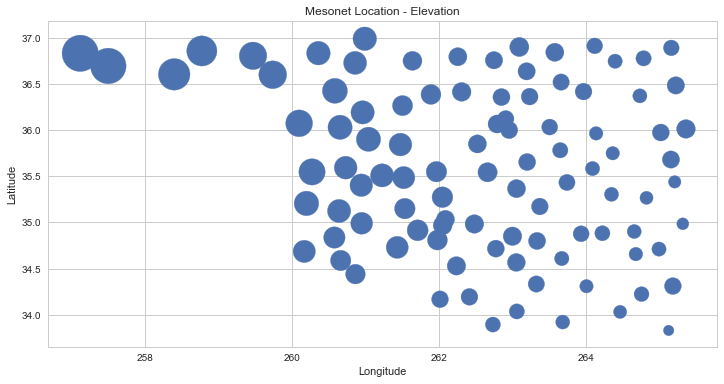

In [848]:
plt.figure(figsize=(12,6))
plt.scatter(station.longitude, station.latitude, s=station.elev, marker='o')
plt.title('Mesonet Location - Elevation')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

#larger bubbles indicate that elevation is increasing towards the North West. It's possible that we will need to 
#account for elevation in the prediction model.

In [39]:
#We will use the lat/lon of out stations to grab the the array date in each feature dictionary 

#Convert lat/lon to integers so the locations match
station.latitude = station.latitude.astype(int)
station.longitude = station.longitude.astype(int)
station.head()

#Credit: Dale Jung
#http://stackoverflow.com/questions/16031056/how-to-form-tuple-column-from-two-columns-in-pandas

,stid,latitude,longitude,elev
0,ACME,34,261,397
1,ADAX,34,263,295
2,ALTU,34,260,416
3,APAC,34,261,440
4,ARNE,36,260,719


# Comment

The forecast data is more sparse than the weather station.  In order to match up I rounded the lat/lon of the station data to nearest integer. Now that both the forecast data and the station data are of the same values we can match them together through the dictionaries we created.

In [40]:
#test. Setup one key:value pair 
key = tuple([station.latitude[1],station.longitude[1]])
Temp_dict[key]

[array([ 280.05072021,  282.70159912,  274.69473267, ...,  274.53692627,
         275.71124268,  277.0489502 ], dtype=float32)]

In [41]:
Temp2m_dict[key]

[array([ 281.72628784,  284.24014282,  276.91638184, ...,  276.99179077,
         278.51599121,  278.08010864], dtype=float32)]

In [42]:
Tmin_dict[key]

[array([ 278.91720581,  278.29806519,  272.03341675, ...,  270.81951904,
         273.62554932,  277.31311035], dtype=float32)]

In [43]:
Tmax_dict[key]

[array([ 287.04013062,  285.03152466,  278.06170654, ...,  278.51446533,
         280.85488892,  282.34542847], dtype=float32)]

In [44]:
#Now we want to use the lat/lon from each station to obtain the feature data.
#For example, Press_dict[station.latitude,station.longitude]

stn_press={}
for s in range(len(station)):
    k = tuple([station.latitude[s],station.longitude[s]]) #key
    v = Press_dict[station.latitude[s],station.longitude[s]] #value
    stn_press[k] = [v]

print stn_press[34,260] #returns the pressure over time for each weather station

#check the length.  Should still be 5113
print len(stn_press[33,262][0][0])

[[array([ 102113.1015625,  101492.4375   ,  101996.6796875, ...,
        101999.7109375,  101824.4765625,  102547.75     ], dtype=float32)]]
5113


In [45]:
#Let's turn the above into a function
#Function that inputs station and feature dictionary to output feature dictionary of that station.

def station_dict(station,feature_dict):    
    #station is dataframe from station info csv
    #feature_dict = dictionary created from netcdf4 i.e Press_dict
    #stn_dict = is new dictionary to be created
    stn_dict = {}
    for s in range(len(station)):
        k = tuple([station.latitude[s],station.longitude[s]]) #key
        v = feature_dict[station.latitude[s],station.longitude[s]] #value
        stn_dict[k] = [v]
    return stn_dict

In [46]:
#Test
stn_dlwave = station_dict(station,Dlwave_dict)
stn_dlwave[33,262]

[[array([ 274.        ,  262.        ,  233.84858704, ...,  234.        ,
          250.25332642,  248.        ], dtype=float32)]]

In [47]:
#Run function for remaining features.  Now we will have all the features for each station location.
stn_temp = station_dict(station,Temp_dict)
stn_temp2m = station_dict(station,Temp2m_dict)
stn_tmin = station_dict(station,Tmin_dict)
stn_tmax = station_dict(station,Tmax_dict)

stn_dlwave = station_dict(station,Dlwave_dict)
stn_dswave = station_dict(station,Dswave_dict)
stn_ulwave = station_dict(station,Ulwave_dict)
stn_ulwave_atm = station_dict(station,Ulwave_atm_dict)
stn_uswave = station_dict(station,Uswave_dict)

stn_press = station_dict(station,Press_dict)
stn_cloud = station_dict(station,Cloud_dict)
stn_precip = station_dict(station,Precip_dict)
stn_pwat = station_dict(station,Pwat_dict)
stn_humid = station_dict(station,Humid_dict)
stn_conden = station_dict(station,Conden_dict)

#By manually typing out each one i have ensured that each feature was loaded correctly.

### Comment
Up until this state we have gone through a lot of effort to load and convert data into multiple dictionaries. Below exports the dictionary features to into csv.  It remains commented out because I have already exported my files

In [48]:
'''
import csv

with open('stn_temp.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_temp.items():
        writer.writerow([key, value])

with open('stn_temp2m.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_temp2m.items():
        writer.writerow([key, value])

with open('stn_tmin.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_tmin.items():
        writer.writerow([key, value])

with open('stn_tmax.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_tmax.items():
        writer.writerow([key, value])

with open('stn_dlwave.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_dlwave.items():
        writer.writerow([key, value])

with open('stn_dswave.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_dswave.items():
        writer.writerow([key, value])

with open('stn_ulwave.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_ulwave.items():
        writer.writerow([key, value])

with open('stn_ulwave_atm.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_ulwave_atm.items():
        writer.writerow([key, value]) 

with open('stn_uswave.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_uswave.items():
        writer.writerow([key, value]) 
    
with open('stn_press.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_press.items():
        writer.writerow([key, value]) 
    
with open('stn_cloud.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_cloud.items():
        writer.writerow([key, value]) 
    
with open('stn_precip.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_precip.items():
        writer.writerow([key, value])

with open('stn_pwat.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_pwat.items():
        writer.writerow([key, value])

with open('stn_humid.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_humid.items():
        writer.writerow([key, value])

with open('stn_conden.csv', 'wb') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in stn_conden.items():
        writer.writerow([key, value])
#Credit: Mark Tolonen
#https://stackoverflow.com/questions/8685809/python-writing-a-dictionary-to-a-csv-file-with-one-line-for-every-key-value

'''

"\nimport csv\n\nwith open('stn_temp.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_temp.items():\n        writer.writerow([key, value])\n\nwith open('stn_temp2m.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_temp2m.items():\n        writer.writerow([key, value])\n\nwith open('stn_tmin.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_tmin.items():\n        writer.writerow([key, value])\n\nwith open('stn_tmax.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_tmax.items():\n        writer.writerow([key, value])\n\nwith open('stn_dlwave.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_dlwave.items():\n        writer.writerow([key, value])\n\nwith open('stn_dswave.csv', 'wb') as csv_file:\n    writer = csv.writer(csv_file)\n    for key, value in stn_dswave.items():\n        writer.writerow([key, valu

In [49]:
#The code below will read the dicitonaries back in when we need it.
#For now we'll comment this out
'''
with open('stn_temp.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_temp = dict(reader)
with open('stn_temp2m.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_temp2m = dict(reader)
with open('stn_tmin.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_tmin = dict(reader)
with open('stn_tmax.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_tmax = dict(reader)
with open('stn_dlwave.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_dlwave = dict(reader)
with open('stn_dswave.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_dswave = dict(reader)
with open('stn_ulwave.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_ulwave = dict(reader)
with open('stn_ulwave_atm.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_ulwave_atm = dict(reader)
with open('stn_uswave.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_uswave = dict(reader)
with open('stn_press.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_press = dict(reader)
with open('stn_cloud.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_cloud = dict(reader)
with open('stn_precip.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_precip = dict(reader)
with open('stn_pwat.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_pwat = dict(reader)
with open('stn_humid.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_humid = dict(reader)
with open('stn_conden.csv', 'rb') as csv_file:
    reader = csv.reader(csv_file)
    stn_conden = dict(reader)
'''

"\nwith open('stn_temp.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_temp = dict(reader)\nwith open('stn_temp2m.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_temp2m = dict(reader)\nwith open('stn_tmin.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_tmin = dict(reader)\nwith open('stn_tmax.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_tmax = dict(reader)\nwith open('stn_dlwave.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_dlwave = dict(reader)\nwith open('stn_dswave.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_dswave = dict(reader)\nwith open('stn_ulwave.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_ulwave = dict(reader)\nwith open('stn_ulwave_atm.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    stn_ulwave_atm = dict(reader)\nwith open('stn_uswave.csv', 'rb') as csv_file:\n    reader = csv.reader(csv_file)\n    st

In [955]:
"""stn_temp[(33, 262)]

#Warning, if loading csv data then it needs to look like this:
#stn_temp['(33, 262)']
"""

"stn_temp[(33, 262)]\n\n#Warning, if loading csv data then it needs to look like this:\n#stn_temp['(33, 262)']\n"

### Comment

So now we have found a way to load and view the feature data into a format that we can interpert and model.  This concludes the data loading section of my capstone.  We can now begin our exploratory data analysis

## Exploratory Data Analysis

In this section we will look at the feature data, and target data to see if we can find any insights

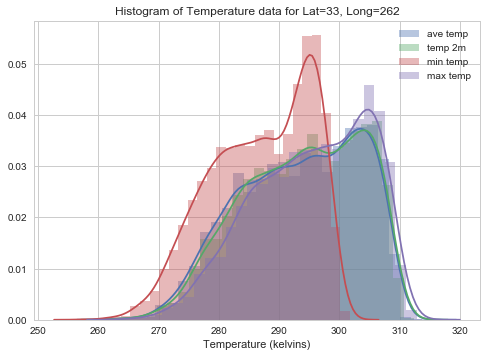

In [954]:
#Let's look at one of the lat/lon locations and view each feature on a histogram
#lat=33
#Lon=262

#All Temperature features
sns.distplot(stn_temp[(33, 262)],hist=True,label='ave temp')
sns.distplot(stn_temp2m[(33, 262)],hist=True,label='temp 2m')
sns.distplot(stn_tmin[(33, 262)],hist=True, label='min temp')
sns.distplot(stn_tmax[(33, 262)],hist=True, label= 'max temp')
plt.title('Histogram of Temperature data for Lat=33, Long=262')
plt.xlabel('Temperature (kelvins)')
plt.legend()
plt.show()

#As expected all the temperature data have similar distributions.  If they were different then I would suspect outliers.

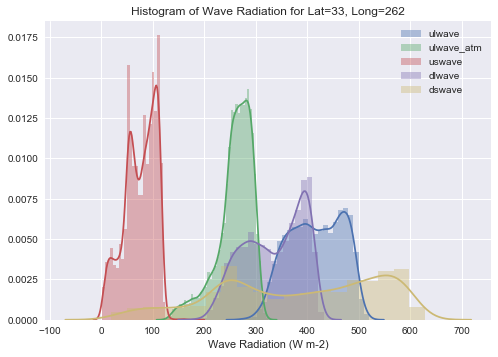

In [52]:
#Now let's look at long and short wave radiation
#lat=33
#Lon=262

#All Temperature features
sns.distplot(stn_ulwave[(33, 262)],hist=True,label='ulwave')
sns.distplot(stn_ulwave_atm[(33, 262)],hist=True,label='ulwave_atm')
sns.distplot(stn_uswave[(33, 262)],hist=True, label='uswave')
sns.distplot(stn_dlwave[(33, 262)],hist=True, label= 'dlwave')
sns.distplot(stn_dswave[(33, 262)],hist=True, label= 'dswave')
plt.title('Histogram of Wave Radiation for Lat=33, Long=262')
plt.xlabel('Wave Radiation (W m-2)')
plt.legend()
plt.show()

#This is interesting.  I expected to see similarities between some of the waves but they all have quite different distributions

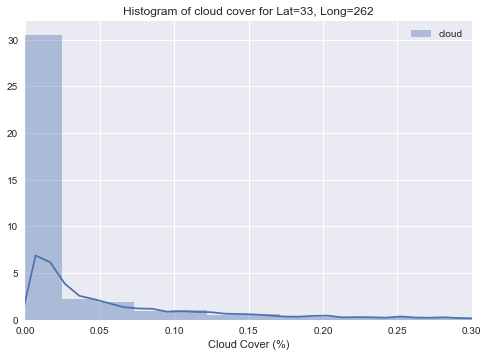

In [53]:
sns.distplot(stn_cloud[(33, 262)],hist=True,label='cloud')
plt.title('Histogram of cloud cover for Lat=33, Long=262')
plt.xlabel('Cloud Cover (%)')
plt.xlim(0,0.3)
plt.legend()
plt.show()

# This could be quite variable from station to station and also is generally close to zero.

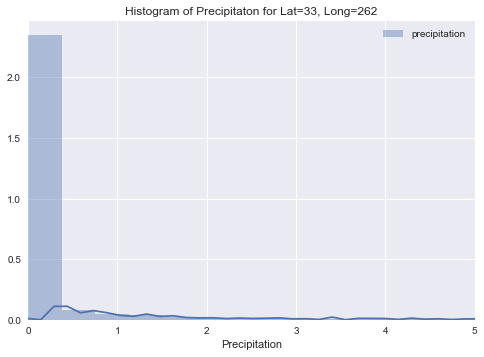

In [54]:
sns.distplot(stn_precip[(33, 262)],hist=True,label='precipitation')
plt.title('Histogram of Precipitaton for Lat=33, Long=262')
plt.xlabel('Precipitation')
plt.xlim(0,5)
plt.legend()
plt.show()

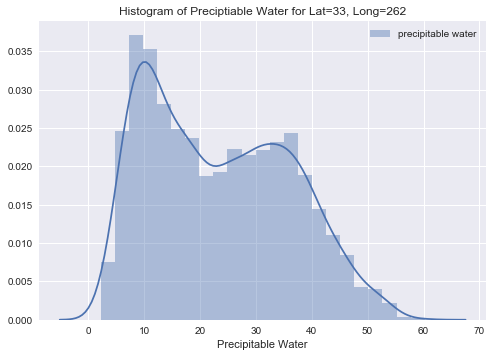

In [55]:
sns.distplot(stn_pwat[(33, 262)],hist=True,label='precipitable water')
#sns.distplot(stn_conden[(33, 262)],hist=True,label='conden')
plt.title('Histogram of Preciptiable Water for Lat=33, Long=262')
plt.xlabel('Precipitable Water')
#plt.xlim(0,5)
plt.legend()
plt.show()

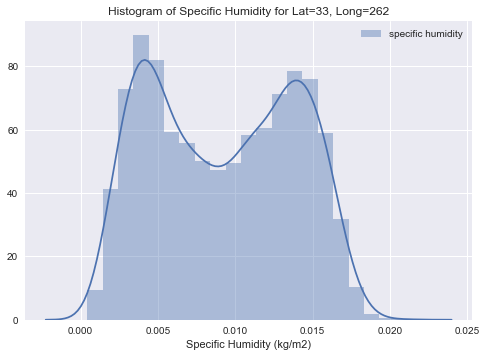

In [56]:
sns.distplot(stn_humid[(33, 262)],hist=True,label='specific humidity')
#sns.distplot(stn_conden[(33, 262)],hist=True,label='conden')
plt.title('Histogram of Specific Humidity for Lat=33, Long=262')
plt.xlabel('Specific Humidity (kg/m2)')
#plt.xlim(0,5)
plt.legend()
plt.show()

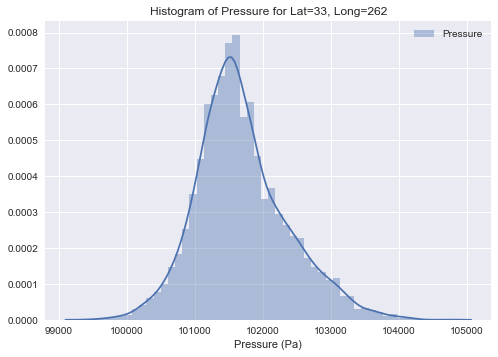

In [57]:
sns.distplot(stn_press[(33, 262)],hist=True,label='Pressure')
#sns.distplot(stn_conden[(33, 262)],hist=True,label='conden')
plt.title('Histogram of Pressure for Lat=33, Long=262')
plt.xlabel('Pressure (Pa)')
#plt.xlim(0,5)
plt.legend()
plt.show()
#Normal distribution of pressure

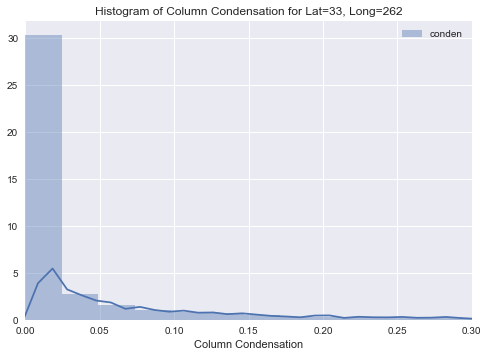

In [58]:
sns.distplot(stn_conden[(33, 262)],hist=True,label='conden')
plt.title('Histogram of Column Condensation for Lat=33, Long=262')
plt.xlabel('Column Condensation')
plt.xlim(0,0.3)
plt.legend()
plt.show()

# Comments
After viewing the histograms there are a few observations
1. Not all the data is normally distributed
2. These are only the features of one set of lat/lon
3. Condensation, precipitation and cloud cover have very low distributions.  Most values are very close to zero.
4. I was suprised to see the varaible distributions in the long and short wave radiation
5. Temperature distributions look to mimic each other
6. Pressure had a normal distribution
7. Specifc humidity and precipitable water appear to have binomial distributions.

In [59]:
stn_precip[33,262][0][0]

array([ 0.,  0.,  0., ...,  0.,  0.,  0.], dtype=float32)

In [60]:
#now lets put one location into a dataframe
data_cols = ['Precip','U_Long_Wave','U_Short_Wave','D_Long_Wave','U_Long_Wave_atm','D_Short_Wave',
             'Precip_Water','Humidity','Conden','Tmax','Tmin','Temp','Temp2m','Cloud','Pressure'
             ]
data = pd.DataFrame(np.column_stack([stn_precip[33,262][0][0],
                                     stn_ulwave[33,262][0][0],
                                     stn_uswave[33,262][0][0],
                                     stn_dlwave[33,262][0][0],
                                     stn_ulwave_atm[33,262][0][0],
                                     stn_dswave[33,262][0][0],
                                     stn_pwat[33,262][0][0], 
                                     stn_humid[33,262][0][0], 
                                     stn_conden[33,262][0][0],
                                     stn_tmax[33,262][0][0],
                                     stn_tmin[33,262][0][0],
                                     stn_temp[33,262][0][0],
                                     stn_temp2m[33,262][0][0],             
                                     stn_cloud[33,262][0][0],
                                     stn_press[33,262][0][0]]),
                    columns=data_cols)

data.describe()

,Precip,U_Long_Wave,U_Short_Wave,D_Long_Wave,U_Long_Wave_atm,D_Short_Wave,Precip_Water,Humidity,Conden,Tmax,Tmin,Temp,Temp2m,Cloud,Pressure
count,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000,5113.000000
mean,0.284184,416.151978,75.527672,335.047180,259.298584,380.341675,23.385418,0.009212,0.044537,295.386017,286.932526,293.547760,293.943085,0.044150,101684.398438
std,1.133874,51.196663,30.004147,57.164608,34.547985,155.522919,12.692043,0.004661,0.116514,9.407858,8.250437,9.776986,9.606560,0.116626,672.857544
min,0.000000,272.808990,2.000000,182.310242,124.341782,20.000000,2.200000,0.000420,0.000000,263.516541,257.382355,262.072235,262.645325,0.000000,99443.992188
25%,0.000000,374.297028,54.000000,287.000000,245.078064,250.000000,11.900000,0.004840,0.000200,288.323059,280.606903,285.940002,286.489044,0.000000,101245.023438
50%,0.000000,417.075104,80.000000,342.423004,265.839874,396.000000,22.100000,0.009270,0.001900,296.394470,287.793610,294.455139,294.734985,0.000000,101595.617188
75%,0.020000,461.525665,101.000000,388.000000,284.343658,523.000000,33.700001,0.013420,0.026400,303.535278,294.281342,302.055603,302.156342,0.030000,102061.960938
max,18.830000,519.565430,183.000000,433.014313,324.000000,629.000000,60.213867,0.021300,1.221700,314.596283,301.750580,313.793060,312.462006,1.220000,104710.320312


In [61]:
#Just as a quality check to see if any nulls
print data.isnull().sum()

Precip             0
U_Long_Wave        0
U_Short_Wave       0
D_Long_Wave        0
U_Long_Wave_atm    0
D_Short_Wave       0
Precip_Water       0
Humidity           0
Conden             0
Tmax               0
Tmin               0
Temp               0
Temp2m             0
Cloud              0
Pressure           0
dtype: int64


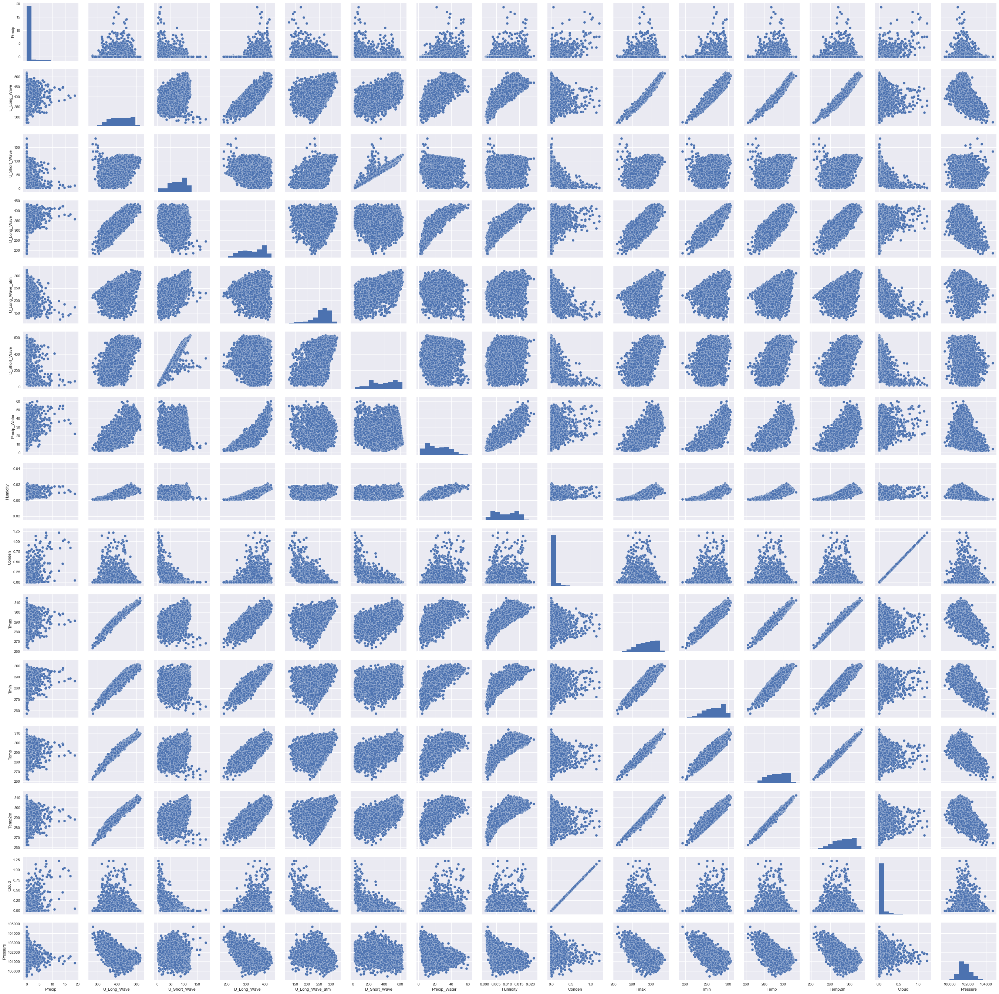

In [261]:
sns.pairplot(data)
plt.show()

#The pairplot indiactes there may be some correlation between varaibles.

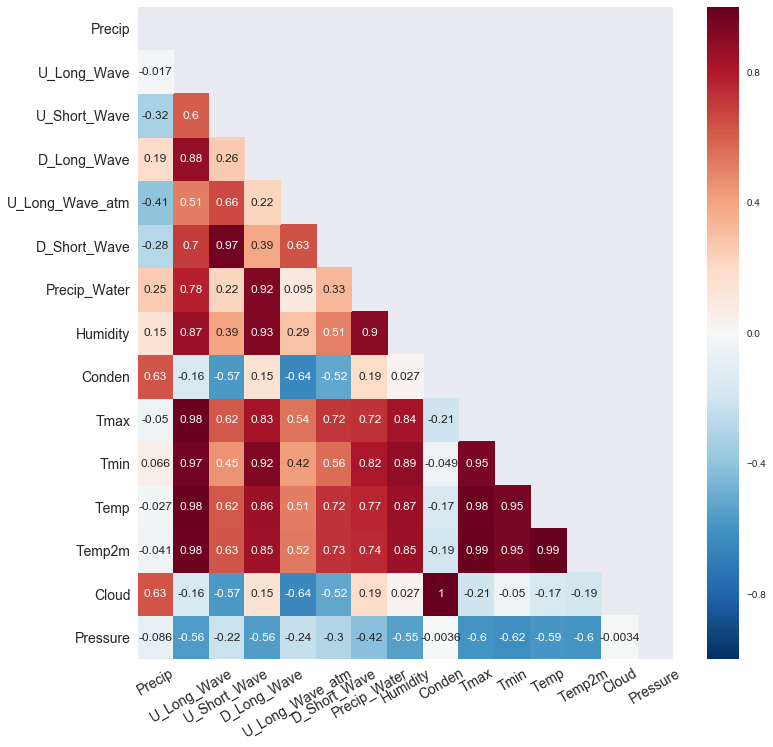

In [62]:
#Create heat map

#Credit K.Katovich and J.Nelson from GA lessons

def correlation_heat_map(df):
    corrs = df.corr()

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(12,12))

    # Generate a mask for the upper triangle (taken from seaborn example gallery)
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Plot the heatmap with seaborn.
    # Assign the matplotlib axis the function returns. This will let us resize the labels.
    ax = sns.heatmap(corrs, mask=mask, annot=True)

    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14, rotation=30)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14, rotation=0)

    # If you put plt.show() at the bottom, it prevents those useless printouts from matplotlib.
    plt.show()
    
correlation_heat_map(data)

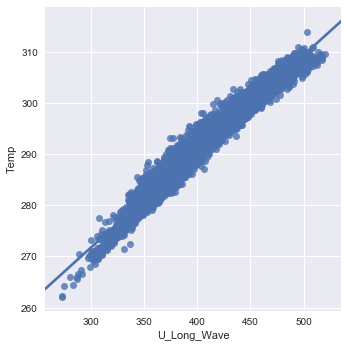

In [63]:
sns.lmplot(x='U_Long_Wave',y='Temp',data=data)
plt.show()
#Looks like a pretty good correlation between Long wave radiation and Temperature

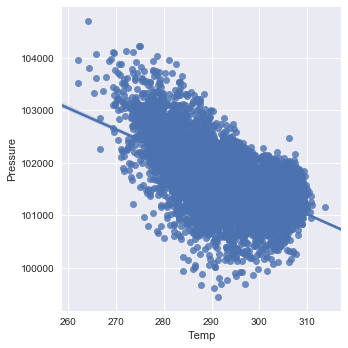

In [64]:
sns.lmplot(x='Temp',y='Pressure',data=data)
plt.show()
#As expected, anti-correlation of pressure vs temperature although I expected to see a better relationship.

## Comment
From the above we can observe a few things.
1. We have 5113 lines which matches the number of lines in our station data.  THis makes things so much easier later.
2. Precipitation, Condensation and cloud cover have very little distribution.  Most values are zero. Have a feeling we will be able to drop these when we do PCA.
3.  No Null values which is good
4. Looks like there are some strong relationships between certain features like Temperature and long wave radiation (Ulwave
5. We expect there to be a high correlation between the min, max and average temperatures
6. The length of each arrray is 5113 which corresponds to 14 years in days.

So it looks like the forecast data is now in a state that it can be input into a model for prediction.  The next step is to look at the training data set.


In [634]:
#Now lets load our mesonet data which will be our target variable.
#This file is uploaded to repo
train_csv =  '/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/train.csv'

#target variable
y = pd.read_csv(train_csv)
print y.shape
y.head()

#The first column represents the date.  All columns after that present each mesonet station where the value on each day is the 
#total daily incoming solar energy in (J m-2).

#The shape is 5113.  This is great news because it means that the dates line up and we can match the arrays in time!

(5113, 99)


,Date,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
0,19940101,12384900,11930700,12116700,12301200,10706100,10116900,11487900,11182800,10848300,...,10771800,12116400,11308800,12361800,11331600,10644300,11715600,11241000,10490100,10545300
1,19940102,11908500,9778500,10862700,11666400,8062500,9262800,9235200,3963300,3318300,...,4314300,10733400,9154800,12041400,9168300,4082700,9228000,5829900,7412100,3345300
2,19940103,12470700,9771900,12627300,12782700,11618400,10789800,11895900,4512600,5266500,...,2976900,11775000,10700400,12687300,11324400,2746500,3686700,4488900,9712200,4442100
3,19940104,12725400,6466800,13065300,12817500,12134400,11816700,12186600,3212700,8270100,...,3476400,12159600,11907000,12953100,11903700,2741400,4905000,4089300,11401500,4365000
4,19940105,10894800,11545200,8060400,10379400,6918600,9936300,6411300,9566100,8009400,...,6393300,11419500,7334400,10178700,7471500,8235300,11159100,10651500,10006200,8568300


In [635]:
#Let's see some basic stats
y.describe()

,Date,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,...,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03
mean,2.000567e+07,1.687746e+07,1.623753e+07,1.711919e+07,1.701057e+07,1.756017e+07,1.761214e+07,1.730407e+07,1.596963e+07,1.606171e+07,...,1.573722e+07,1.664874e+07,1.695942e+07,1.703977e+07,1.707443e+07,1.533171e+07,1.600055e+07,1.565719e+07,1.742340e+07,1.608501e+07
std,4.031286e+04,7.869606e+06,7.905850e+06,7.702989e+06,7.883455e+06,7.917965e+06,7.911267e+06,7.868140e+06,8.062981e+06,7.770310e+06,...,7.985206e+06,7.976416e+06,7.874450e+06,7.756531e+06,7.703919e+06,7.998919e+06,7.949959e+06,7.909371e+06,8.031638e+06,8.039836e+06
min,1.994010e+07,1.200000e+04,5.100000e+05,9.000000e+02,3.300000e+03,4.773000e+05,3.000000e+02,5.106000e+05,7.470000e+04,3.600000e+04,...,1.746000e+05,7.800000e+04,6.162000e+05,3.300000e+03,7.593000e+05,3.600000e+04,6.300000e+03,1.680000e+04,1.884000e+05,8.700000e+04
25%,1.997070e+07,1.140420e+07,1.061100e+07,1.167450e+07,1.163700e+07,1.166640e+07,1.149360e+07,1.171260e+07,9.794700e+06,1.048576e+07,...,9.699328e+06,1.101360e+07,1.144320e+07,1.178130e+07,1.158930e+07,9.437184e+06,1.035210e+07,9.908700e+06,1.140120e+07,1.007550e+07
50%,2.000123e+07,1.694640e+07,1.629930e+07,1.707360e+07,1.706250e+07,1.757850e+07,1.752090e+07,1.717650e+07,1.572570e+07,1.587300e+07,...,1.560390e+07,1.659510e+07,1.683870e+07,1.721520e+07,1.702950e+07,1.489860e+07,1.583310e+07,1.554810e+07,1.735410e+07,1.603740e+07
75%,2.004070e+07,2.373480e+07,2.302740e+07,2.390370e+07,2.390940e+07,2.450370e+07,2.468310e+07,2.424120e+07,2.294040e+07,2.293830e+07,...,2.265750e+07,2.358660e+07,2.399280e+07,2.369550e+07,2.374230e+07,2.213250e+07,2.270550e+07,2.259360e+07,2.455770e+07,2.309370e+07
max,2.007123e+07,3.134790e+07,3.122700e+07,3.141150e+07,3.161610e+07,3.264570e+07,3.288480e+07,3.188790e+07,3.170220e+07,3.077190e+07,...,3.121410e+07,3.191760e+07,3.141420e+07,3.126240e+07,3.174660e+07,3.203010e+07,3.190230e+07,3.108780e+07,3.269550e+07,3.146640e+07


In [636]:
#Check for nulls
y.isnull().sum()

Date    0
ACME    0
ADAX    0
ALTU    0
APAC    0
ARNE    0
BEAV    0
BESS    0
BIXB    0
BLAC    0
BOIS    0
BOWL    0
BREC    0
BRIS    0
BUFF    0
BURB    0
BURN    0
BUTL    0
BYAR    0
CAMA    0
CENT    0
CHAN    0
CHER    0
CHEY    0
CHIC    0
CLAY    0
CLOU    0
COOK    0
COPA    0
DURA    0
       ..
PERK    0
PRYO    0
PUTN    0
REDR    0
RETR    0
RING    0
SALL    0
SEIL    0
SHAW    0
SKIA    0
SLAP    0
SPEN    0
STIG    0
STIL    0
STUA    0
SULP    0
TAHL    0
TALI    0
TIPT    0
TISH    0
VINI    0
WASH    0
WATO    0
WAUR    0
WEAT    0
WEST    0
WILB    0
WIST    0
WOOD    0
WYNO    0
dtype: int64

As expected No null values which is good.

In [637]:
#Convert Date to pandas date time
y['Date'] = pd.to_datetime(y['Date'], format='%Y%m%d')
#mesonet.head()

#Credit:jezrael
#http://stackoverflow.com/questions/43116897/convert-float64-column-to-datetime-pandas

In [639]:
y.Date

0      1994-01-01
1      1994-01-02
2      1994-01-03
3      1994-01-04
4      1994-01-05
5      1994-01-06
6      1994-01-07
7      1994-01-08
8      1994-01-09
9      1994-01-10
10     1994-01-11
11     1994-01-12
12     1994-01-13
13     1994-01-14
14     1994-01-15
15     1994-01-16
16     1994-01-17
17     1994-01-18
18     1994-01-19
19     1994-01-20
20     1994-01-21
21     1994-01-22
22     1994-01-23
23     1994-01-24
24     1994-01-25
25     1994-01-26
26     1994-01-27
27     1994-01-28
28     1994-01-29
29     1994-01-30
          ...    
5083   2007-12-02
5084   2007-12-03
5085   2007-12-04
5086   2007-12-05
5087   2007-12-06
5088   2007-12-07
5089   2007-12-08
5090   2007-12-09
5091   2007-12-10
5092   2007-12-11
5093   2007-12-12
5094   2007-12-13
5095   2007-12-14
5096   2007-12-15
5097   2007-12-16
5098   2007-12-17
5099   2007-12-18
5100   2007-12-19
5101   2007-12-20
5102   2007-12-21
5103   2007-12-22
5104   2007-12-23
5105   2007-12-24
5106   2007-12-25
5107   200

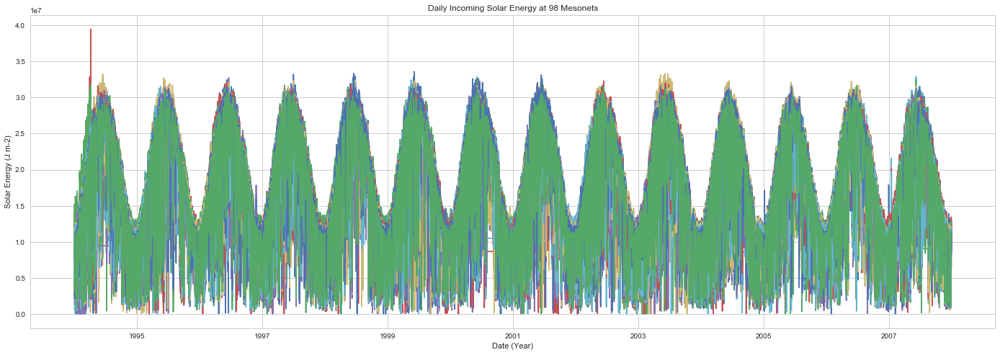

In [617]:
#Plot all stations (y) in time series

plt.figure(figsize=(24,8))

for colname, col in y.iteritems():
    if colname != 'Date':
         plt.plot(y['Date'], y[colname], label=colname)
            
plt.title('Daily Incoming Solar Energy at 98 Mesonets')
plt.xlabel('Date (Year)')
plt.ylabel('Solar Energy (J m-2)')
plt.show()



### EDA conclusion

The above plot is a bit messy but it shows the cyclical nature of weather.  In the winter months solar energy generation is low and in the summer it is high.  It also looks sinusoidal which is great news because this means we can predict!

# Setup Prediction for One Station 

Our data is now ready for model prediction.  To summarize we have the following:

Training set: 98 weather stations.

Each station has 14 years of solar energy prediction (5113 rows)

Predictor set:
15 forescast features
Each feature has the closest lat/lon with 14 years of feature data (5113 rows)

For now let's choose one station and predict over 1/3 of the data.  Once we find a model we like we can then propogate to the rest of the data.

In [618]:
#First we need to divide our dataset into groups.  For now I will choose continuous groups of 3
#Divide the training set into three

print 5113/3 #This tells me which rows to split
y.Date[0] #starting date

1704


Timestamp('1994-01-01 00:00:00')

In [91]:
from datetime import timedelta

#Below will tell us the date we need to split.

print 'Group 1'
print '%s to %s' % (y.Date[0], y.Date[0] + timedelta(days=1704))
print 'Group 2'
print '%s to %s' % (y.Date[0] + timedelta(days=1705), y.Date[1705] + timedelta(days=3408))
print 'Group 3'
print '%s to %s' % (y.Date[0] + timedelta(days=3409), y.Date[3408] + timedelta(days=1704))
#print 'Group 4'
#print '%s to %s' % (y.Date[0], y.Date[0] + timedelta(days=1704))


Group 1
1994-01-01 00:00:00 to 1998-09-01 00:00:00
Group 2
1998-09-02 00:00:00 to 2008-01-01 00:00:00
Group 3
2003-05-03 00:00:00 to 2007-12-31 00:00:00


In [619]:
#As part of our subset test lets take four stations ACME,ADAX,ALTU,APAC from 1994-01-01 to 1994-12-31

#Training set Group 1
subset1 = y.iloc[:,1]
subset1 = y[0:1704]
print subset1.shape
#print subset1.head()

#Let's creat subsets for Group 2 and 3 which we wil use later

#Training set Group 2
subset2 = y.iloc[:,1]
subset2 = y[1704:3408]
print subset2.shape
#print subset2.head()

#Training set Group 3
subset3 = y.iloc[:,1]
subset3 = y[3408:5112]
print subset3.shape
subset3.head()

#All subsets are the same size.  

(1704, 99)
(1704, 99)
(1704, 99)


,Date,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
3408,2003-05-02,16656900,22253400,12807000,19178400,20463000,26210400,15944400,23589000,23049300,...,24110700,19213500,22429500,11215800,19777500,17304000,25230300,11431500,23100300,24744600
3409,2003-05-03,10032900,15520800,14231700,11421900,12169200,16096200,9381900,17292300,13119000,...,19937400,12256800,9021000,15024600,9094500,17190600,21655200,21445500,14535300,15772800
3410,2003-05-04,25098000,17916000,26853900,24983400,28203300,29421300,27006000,14935800,22062300,...,12295200,21754500,27245700,20873100,26003700,9028500,9415500,5819700,28352700,19051800
3411,2003-05-05,29298600,24124800,29076300,29231700,29427900,29725800,29485800,29134200,28643400,...,29077500,27897000,30476100,24623700,28398900,23607300,20475000,18900600,29763300,29186700
3412,2003-05-06,29277000,23730000,28063800,27807900,25565100,24387300,26819700,24560100,23986500,...,21038400,28053300,27271800,26471400,26498100,19263000,21861000,22690500,25696500,23462100


In [101]:
#Recall our station location information we loaded earlier
station.head()

,stid,latitude,longitude,elev
0,ACME,34,261,397
1,ADAX,34,263,295
2,ALTU,34,260,416
3,APAC,34,261,440
4,ARNE,36,260,719


In [106]:
station.stid[0]

'ACME'

In [956]:
#Using the station location latitude and longitude we can link the lat/lon to our features.
#Let's see how this works when we try to recall a feature at a given station.  For now we will use ACME.
#We know the location for ACME is lat=34, lon=261

print 'Solar energy produced at ACME on %s' %y.Date[0]
print y.ACME[0] 

print 'Average Temperature (kelvins) at ACME on %s' %y.Date[0]
print stn_temp[34,261][0][0][1] #ACME lat=34, lon=261

print 'Average Pressure (Pa) at ACME on %s' %y.Date[0]
print stn_press[34,261][0][0][1]

print 'Average downward long wave radiation at ACME on %s' %y.Date[0]
print stn_dlwave[34,261][0][0][1]

Solar energy produced at ACME on 1994-01-01 00:00:00
12384900
Average Temperature (kelvins) at ACME on 1994-01-01 00:00:00
282.478
Average Pressure (Pa) at ACME on 1994-01-01 00:00:00
101313.0
Average downward long wave radiation at ACME on 1994-01-01 00:00:00
260.197


In [957]:
#Check Pressure
sub_press_ACME = stn_press[35,262][0][0][0:1704]
#len(sub_press_ACME)

In [110]:
#The above works but we manually entered the lat and lon. Let's convert station dataframe to a dictionary
stn = station.drop('elev',1)
stn_dict = stn.set_index('stid').T.to_dict('list')
#Credit: Alex Riley
#http://stackoverflow.com/questions/26716616/convert-a-pandas-dataframe-to-a-dictionary

In [114]:
#Function creates subset array for each station.  In this case we just want to look at Group1 
def station_feature(stn_feat1, stn_dict, stid='stid'):
    sub_feat1_stn = stn_feat1[stn_dict[stid][0],stn_dict[stid][1]][0][0]
    return sub_feat1_stn[0:5]

#End goal is to expand this function or create for loop so it can out put all feature information in one loop.

In [958]:
#Function creates subset array of each feature for each station.
def station_feature(stn_feat1, stn_feat2, stn_feat3,stn_feat4,stn_feat5,stn_feat6,stn_feat7,stn_feat8,stn_feat9,
                    stn_feat10, stn_feat11, stn_feat12, stn_feat13, stn_feat14, stn_feat15,
                    stn_dict, start, end, stid='stid'):
    #Stn_feat1 - 15 =array data of each feature
    #stn_dict = station id is the 'key': value is lat/lon
    #start = start of the array
    #end = end of the array
    #stid = station id
    
    #Create list to output feature data for each station
    sub_feat1_stn = stn_feat1[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat2_stn = stn_feat2[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat3_stn = stn_feat3[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat4_stn = stn_feat4[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat5_stn = stn_feat5[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat6_stn = stn_feat6[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat7_stn = stn_feat7[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat8_stn = stn_feat8[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat9_stn = stn_feat9[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat10_stn = stn_feat10[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat11_stn = stn_feat11[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat12_stn = stn_feat12[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat13_stn = stn_feat13[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat14_stn = stn_feat14[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]
    sub_feat15_stn = stn_feat15[stn_dict[stid][0],stn_dict[stid][1]][0][0][start:end]

    
    return sub_feat1_stn,sub_feat2_stn,sub_feat3_stn,sub_feat4_stn,sub_feat5_stn, sub_feat6_stn,sub_feat7_stn,sub_feat8_stn,sub_feat9_stn,sub_feat10_stn, sub_feat11_stn,sub_feat12_stn,sub_feat13_stn,sub_feat14_stn,sub_feat15_stn


In [214]:
sub_press_ACME, sub_temp_ACME, sub_temp2m_ACME, sub_tmin_ACME, sub_tmax_ACME, sub_dlwave_ACME, sub_dswave_ACME, sub_ulwave_ACME, sub_ulwave_atm_ACME, sub_uswave_ACME, sub_cloud_ACME, sub_precip_ACME, sub_pwat_ACME,sub_humid_ACME, sub_conden_ACME = station_feature(stn_press,
                  stn_temp,
                  stn_temp2m,
                  stn_tmin,
                  stn_tmax,
                  stn_dlwave,
                  stn_dswave,
                  stn_ulwave,
                  stn_ulwave_atm,
                  stn_uswave,
                  stn_cloud,
                  stn_precip,
                  stn_pwat,
                  stn_humid,
                  stn_conden,
                  stn_dict,0,5113,stid='ACME')



print 'ACME pressure: %s: ' % sub_press_ACME
print 'ACME temperature: %s: ' % sub_temp_ACME
print 'ACME temp 2m: %s: ' % sub_temp2m_ACME
print 'ACME min temp: %s: ' % sub_tmin_ACME
print 'ACME max temp: %s: ' % sub_tmax_ACME

#Check
#All value are different. Function is working. its grabbing all temperature values. Values are different!

ACME pressure: [ 101989.7421875  101313.0390625  102099.578125  ...,  102080.03125
  101850.875      102458.546875 ]: 
ACME temperature: [ 280.1506958   282.478302    279.21670532 ...,  274.97381592  274.41183472
  276.14178467]: 
ACME temp 2m: [ 281.05184937  284.40945435  280.9336853  ...,  277.72485352  277.46707153
  278.1958313 ]: 
ACME min temp: [ 280.75497437  279.35656738  274.66104126 ...,  269.51806641  271.90133667
  276.68310547]: 
ACME max temp: [ 287.06747437  289.03152466  280.93582153 ...,  279.64572144  281.82736206
  282.3770752 ]: 


In [199]:
#Check
print 'ACME downward long wave: %s: ' % sub_dlwave_ACME
print 'ACME downward short wave: %s: ' % sub_dswave_ACME
print 'ACME upward long wave: %s: ' % sub_ulwave_ACME
print 'ACME upward long wave atmosphere: %s: ' % sub_ulwave_atm_ACME
print 'ACME upward short wave: %s: ' % sub_uswave_ACME
#Looks good.

ACME downward long wave: [ 261.03826904  260.19702148  231.61050415 ...,  236.40386963  230.
  237.33813477]: 
ACME downward short wave: [ 220.  210.  220. ...,  210.  220.  220.]: 
ACME upward long wave: [ 362.          357.92477417  340.07876587 ...,  321.91592407  330.91162109
  340.32284546]: 
ACME upward long wave atmosphere: [ 255.97485352  253.53503418  246.00128174 ...,  229.00640869  246.23280334
  252.46621704]: 
ACME upward short wave: [ 51.  49.  52. ...,  48.  55.  55.]: 


In [200]:
#Check
print 'ACME cloud cover: %s: ' % sub_cloud_ACME
print 'ACME precipitation: %s: ' % sub_precip_ACME
print 'ACME preciptiable water: %s: ' % sub_pwat_ACME
print 'ACME humidity: %s: ' % sub_humid_ACME
print 'ACME condensation: %s: ' % sub_conden_ACME
#Looks good.

ACME cloud cover: [ 0.    0.    0.   ...,  0.03  0.    0.  ]: 
ACME precipitation: [ 0.  0.  0. ...,  0.  0.  0.]: 
ACME preciptiable water: [  8.60000038  10.19999981   6.19999981 ...,   8.60004139   4.95499039
   4.46897411]: 
ACME humidity: [ 0.00336     0.00299     0.00277511 ...,  0.00243     0.00306803
  0.0019048 ]: 
ACME condensation: [  1.30000000e-03   3.00000014e-04   3.00000014e-04 ...,   3.03000007e-02
   9.99999975e-05   9.99999975e-05]: 


## Comment
I think the best approach will be to run this function and use the outputs in the model prediction.  So in the end this would be one big loop.  When we go to the next station overwrite the array.  This way we don't have to re-name the outputs from the function everytime which would complicate things.

# Model Prediction for one station

Let's see if we can build a prediction for one station

In [222]:
#Let's call the function we created above but this time use generic station names.  
sub_press, sub_temp, sub_temp2m, sub_tmin, sub_tmax, sub_dlwave, sub_dswave, sub_ulwave, sub_ulwave_atm, sub_uswave, sub_cloud, sub_precip, sub_pwat,sub_humid, sub_conden = station_feature(stn_press,
                  stn_temp,
                  stn_temp2m,
                  stn_tmin,
                  stn_tmax,
                  stn_dlwave,
                  stn_dswave,
                  stn_ulwave,
                  stn_ulwave_atm,
                  stn_uswave,
                  stn_cloud,
                  stn_precip,
                  stn_pwat,
                  stn_humid,
                  stn_conden,
                  stn_dict,0,5113,stid = station.stid[0]) #station.stid[0] = ACME

In [223]:
#define target variable
mesonet = y[station.stid[0]][0:5113] #station.stid[0] = ACME, needs to be from 0:1704

print 'Target variable'
print mesonet[0:5]

Target variable
0    12384900
1    11908500
2    12470700
3    12725400
4    10894800
Name: ACME, dtype: int64


In [224]:
#define X variables

#ACME_fetaures = 
X = pd.DataFrame({'press':sub_press,'temp':sub_temp,'temp2m':sub_temp2m,'tmin':sub_tmin,'tmax':sub_tmax,'dlwave':sub_dlwave,
                  'dswave':sub_dswave,'ulwave':sub_ulwave,'ulwave_atm':sub_ulwave_atm,'uswave':sub_uswave,'cloud':sub_cloud,
                 'precip':sub_precip,'pwat':sub_pwat,'humid':sub_humid,'conden':sub_conden})
#df = pd.DataFrame({'x':x, 'y':y})
print 'Predictor variables'
X.head()

Predictor variables


,cloud,conden,dlwave,dswave,humid,precip,press,pwat,temp,temp2m,tmax,tmin,ulwave,ulwave_atm,uswave
0,0.0,0.0013,261.038269,220.0,0.003360,0.0,101989.742188,8.600000,280.150696,281.051849,287.067474,280.754974,362.000000,255.974854,51.0
1,0.0,0.0003,260.197021,210.0,0.002990,0.0,101313.039062,10.200000,282.478302,284.409454,289.031525,279.356567,357.924774,253.535034,49.0
2,0.0,0.0003,231.610504,220.0,0.002775,0.0,102099.578125,6.200000,279.216705,280.933685,280.935822,274.661041,340.078766,246.001282,52.0
3,0.0,0.0001,244.009567,220.0,0.002688,0.0,102601.992188,4.900000,277.715790,279.466370,281.887024,277.203583,345.664917,250.529114,53.0
4,0.0,0.0038,257.397003,220.0,0.003170,0.0,100816.109375,8.767253,287.466827,288.959381,288.940826,277.954773,355.779510,252.186722,51.0


In [225]:
#Standardize variables
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
Xs = ss.fit_transform(X)

In [226]:
len(Xs)

5113

## First model will be Multi-linear Rregression

In [960]:
#Multi-linear regression using stats model

import statsmodels.api as sm

model = sm.OLS(mesonet,Xs).fit()
#predictions = model.predict(Xs)

#print model stats
model.summary()

#For some reason the multi-linear regression using stats model outputs a different result than sklearn.  
#We will not be using this going forward.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   WYNO   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.155
Method:                 Least Squares   F-statistic:                     63.35
Date:                Fri, 02 Jun 2017   Prob (F-statistic):          2.79e-176
Time:                        16:28:41   Log-Likelihood:                -92230.
No. Observations:                5113   AIC:                         1.845e+05
Df Residuals:                    5098   BIC:                         1.846e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
x1         -3.591e+06   1.11e+07     -0.322      0.747     -2.54e+07  1.83e+07
x2          3.872e+06   1.11e+07      0.348      0.728     -1.79e+07  2.57e+07
x3         -1.228e+06   1.25e+06     -0.984      0.325     -3.67e+06  1.22e+06
x4          3.495e+06   9.49e+05      3.680      0.000      1.63e+06  5.36e+06
x5          1.169e+06   9.45e+05      1.237      0.216     -6.84e+05  3.02e+06
x6          1.894e+05   3.09e+05      0.614      0.539     -4.15e+05  7.94e+05
x7          1.163e+06   3.22e+05      3.617      0.000      5.33e+05  1.79e+06
x8         -2.806e+06    7.6e+05     -3.692      0.000      -4.3e+06 -1.32e+06
x9          5.233e+05   3.16e+06      0.166      0.868     -5.66e+06  6.71e+06
x10         7.465e+06   3.13e+06      2.382      0.017      1.32e+06  1.36e+07
x11        -4.849e+06   2.52e+06     -1.920      0.055      -9.8e+06  1.01e+05
x12        -2.191e+05   1.55e+06     -0.141      0.888     -3.27e+06  2.83e+06
x13         1.848e+06   2.79e+06      0.663      0.507     -3.61e+06  7.31e+06
x14         2.354e+05   3.96e+05      0.595      0.552     -5.41e+05  1.01e+06
x15         1.225e+06   6.81e+05      1.799      0.072      -1.1e+05  2.56e+06
==============================================================================
Omnibus:                      790.783   Durbin-Watson:                   0.085
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3041.341
Skew:                          -0.733   Prob(JB):                         0.00
Kurtosis:                       6.482   Cond. No.                         201.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [328]:
#Multi-linear model using sklearn

from sklearn.cross_validation import cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [970]:
#Divide into test/train split
X_train, X_test, y_train, y_test = train_test_split(Xs, mesonet, test_size=0.9)

mlr = LinearRegression()
#slr.fit(Xs, mesonet)
mlr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [962]:
print 'Test Score'
print mlr.score(X_test, y_test)
print 'Train Score'
print mlr.score(X_train, y_train)

Test Score
0.778919889034
Train Score
0.750068777813


Cross-validated scores: [ 0.69048118  0.81492677  0.7899747   0.72057031  0.83744259  0.72162983
  0.78856992  0.71163557  0.72783013  0.79278732]
Cross-Predicted R2: 0.78534921943


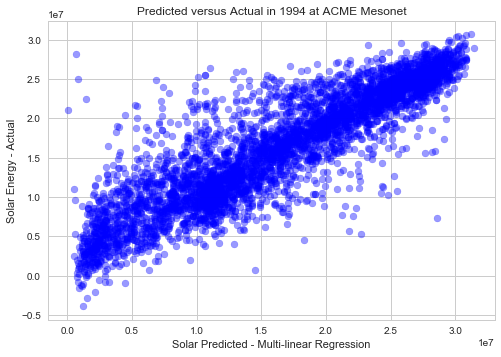

In [996]:
# Perform 5-fold cross validation
#scores = cross_val_score(slr, Xs, y_ACME, cv=5)
scores = cross_val_score(mlr, X_train, y_train, cv=10)
print "Cross-validated scores:", scores

# Make cross validated predictions on the test sets
#predictions = cross_val_predict(slr, Xs, y_ACME, cv=5)
predictions = cross_val_predict(mlr, X_test, y_test, cv=10)
mlr_pred = cross_val_predict(mlr, Xs, mesonet, cv=5)
plt.scatter(y_test, predictions,alpha=0.4,color='blue')
plt.xlabel('Solar Predicted - Multi-linear Regression')
plt.ylabel('Solar Energy - Actual')
plt.title('Predicted versus Actual in 1994 at ACME Mesonet')
# manually calcualte the r2
#r2 = metrics.r2_score(y_ACME, predictions)
r2 = metrics.r2_score(y_test, predictions)
print "Cross-Predicted R2:", r2
plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME_pred_vs_actual.png')
plt.show()

#Not sure why my r2 is better usin sklearn vs stats model!

# Comment
Viewing the plot above we seem to be doing ok at the high end.  based on the scores and r2 the multi-linear regression appears to produce a decent result.  However I have a few concerns, as solar energy reduces on the y-axis we have more spread in the prediction. 

With regards to the stats model when compared to sklearn mlr it produced quite a poor fit.  Not sure why there is such a discrepenacy between stats model and multi-linear regression. 

### Comment
Now let's try a few other machine learning techniques and see how the regressors perform'

In [716]:
#Now let's try and see if we get better results using random forest
from sklearn.cross_validation import cross_val_score

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn import ensemble

start = timeit.default_timer()

#Using Decision Tree
dtc = DecisionTreeRegressor(max_depth=5, max_features='auto')
dtc.fit(X_train, y_train)
dt_pred = cross_val_predict(dtc, Xs, mesonet, cv=5)
#********************************
#Using Random Forest
rf = RandomForestRegressor(n_estimators=100,max_depth=5)
rf.fit(X_train, y_train)
rf_pred = cross_val_predict(rf, Xs, mesonet, cv=5)
rf_pred = cross_val_predict(rf, Xs, mesonet, cv=5)
#********************************
#Using Gradient Boost
gb = GradientBoostingRegressor(loss='ls', learning_rate=0.15, n_estimators=100, subsample=1.0, 
                          criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, 
                          min_weight_fraction_leaf=0.0, max_depth=5, min_impurity_split=1e-07, 
                          init=None, random_state=None, max_features=None, alpha=0.8, verbose=0, 
                          max_leaf_nodes=None, warm_start=False, presort='auto')
gb.fit(X_train, y_train)
gb_pred = cross_val_predict(gb, Xs, mesonet, cv=5)
#********************************

print 'Multi-Linear Regression'
r2_mlr = cross_val_score(mlr, X_test, y_test).mean()
print r2_mlr
print 'Decision Tree Regressor'
r2_dt = cross_val_score(dtc, X_test, y_test).mean()
print r2_dt
print 'Using Random Forest Regressor'
r2_rf = cross_val_score(rf, X_test, y_test).mean()
print r2_rf
print 'Using Gradient Boost Regressor'
r2_gb = cross_val_score(gb, X_test, y_test).mean()
print r2_gb

r2_all[station.stid[0]] = [r2_mlr, r2_dt, r2_rf, r2_gb]
    
stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

#need to output score results!

Multi-Linear Regression
0.778256836633
Decision Tree Regressor
0.686655984967
Using Random Forest Regressor
0.758413696936
Using Gradient Boost Regressor
0.772931814089
Time: 21 s


Cross-Predicted R2: 0.799185998821


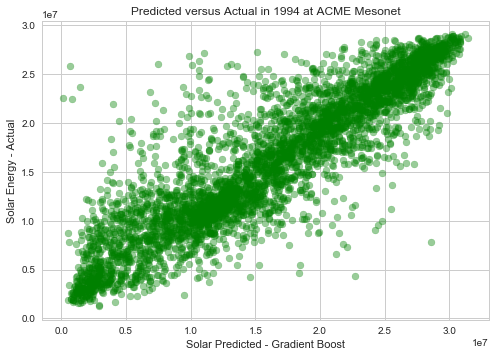

In [992]:
# Make cross validated predictions on the test sets
predictions = cross_val_predict(gb, X_test, y_test, cv=5)
#mlr_pred = cross_val_predict(mlr, Xs, mesonet, cv=5)
plt.scatter(y_test, predictions, alpha=0.4, color='green')
plt.xlabel('Solar Predicted - Gradient Boost')
plt.ylabel('Solar Energy - Actual')
plt.title('Predicted versus Actual in 1994 at ACME Mesonet')
# manually calcualte the r2
#r2 = metrics.r2_score(y_ACME, predictions)
r2 = metrics.r2_score(y_test, predictions)
print "Cross-Predicted R2:", r2
plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME_pred_vs_actual.png')
plt.show()


Cross-Predicted R2: 0.778929739265


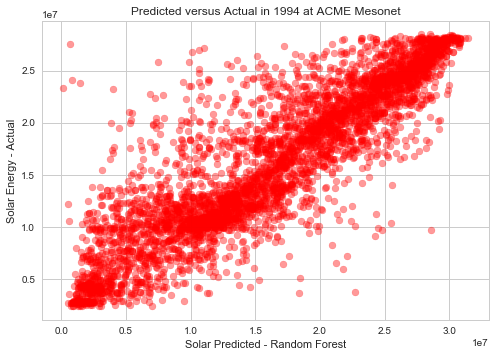

In [993]:
# Make cross validated predictions on the test sets
predictions = cross_val_predict(rf, X_test, y_test, cv=5)
#mlr_pred = cross_val_predict(mlr, Xs, mesonet, cv=5)
plt.scatter(y_test, predictions, alpha=0.4, color='red')
plt.xlabel('Solar Predicted - Random Forest')
plt.ylabel('Solar Energy - Actual')
plt.title('Predicted versus Actual in 1994 at ACME Mesonet')
# manually calcualte the r2
#r2 = metrics.r2_score(y_ACME, predictions)
r2 = metrics.r2_score(y_test, predictions)
print "Cross-Predicted R2:", r2
plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME_pred_vs_actual.png')
plt.show()

Cross-Predicted R2: 0.749534383305


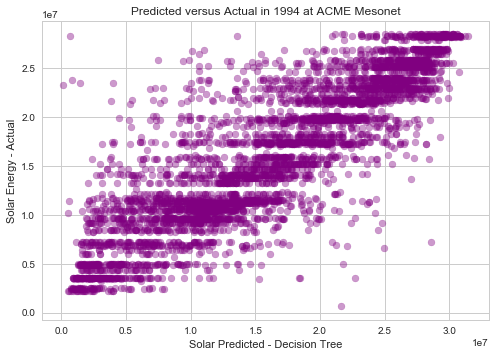

In [994]:
# Make cross validated predictions on the test sets
predictions = cross_val_predict(dtc, X_test, y_test, cv=5)
#mlr_pred = cross_val_predict(mlr, Xs, mesonet, cv=5)
plt.scatter(y_test, predictions, alpha=0.4,color='purple')
plt.xlabel('Solar Predicted - Decision Tree')
plt.ylabel('Solar Energy - Actual')
plt.title('Predicted versus Actual in 1994 at ACME Mesonet')
# manually calcualte the r2
#r2 = metrics.r2_score(y_ACME, predictions)
r2 = metrics.r2_score(y_test, predictions)
print "Cross-Predicted R2:", r2
plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME_pred_vs_actual.png')
plt.show()

### Comment
Gradient Boost is providing the best result however the next best result is multi-linear regression.  Since gradient boosting was performing best let's try and tune the hyperparameters to see if we can improve the results even more.

## Tune Gradient Boost hyper parameters using gridsearch

We successfully ran four models for one station.  Let's see if we can tune the hyper parameters to get a better result for the gradient boost.  

In [999]:
#The nice thing with gradient boost is that we can tune more parameters
#However, we need to be careful not to overfit
start = timeit.default_timer()

#In general the major parameters controlling gradient boost are the ones below.  
gb_params = {
    'learning_rate':[0.05,0.08,0.11,0.14,0.17,0.2],
    'min_samples_split':[2,25,35,45], #0.5-1.0 of data%
    'min_samples_leaf':[2,25,50],
    'n_estimators':[50,100,150],
    'max_depth':[4,6,8,10]
}

gb_gridsearch = GridSearchCV(GradientBoostingRegressor(), gb_params, cv=5, verbose=1)

gb_gridsearch.fit(X_train, y_train)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
Time: 277 s


[Parallel(n_jobs=1)]: Done 4320 out of 4320 | elapsed:  4.6min finished


In [1000]:
gb_gridsearch.best_params_
#After tuning these are the best parameters we should use.  
#When we loop through each station I will update my gridsearch parameters with these

{'learning_rate': 0.14,
 'max_depth': 4,
 'min_samples_leaf': 50,
 'min_samples_split': 2,
 'n_estimators': 50}

In [1001]:
best_gb = gb_gridsearch.best_estimator_
print 'Pre Tuning'
print r2_gb
print 'After tuning hyperparameters'
print cross_val_score(best_gb, X_test, y_test).mean()
print 'Difference'
print str((cross_val_score(best_gb, X_test, y_test).mean() - r2_gb)*100) + ' percent improvement'

Pre Tuning
0.785968469549
After tuning hyperparameters
0.797155775209
Difference
1.11889767781 percent improvement


### Comment
Post tuning we have improived gradient boosting result by a little over 1 percent.  We will use these new parameters when we propogate through all the stations.

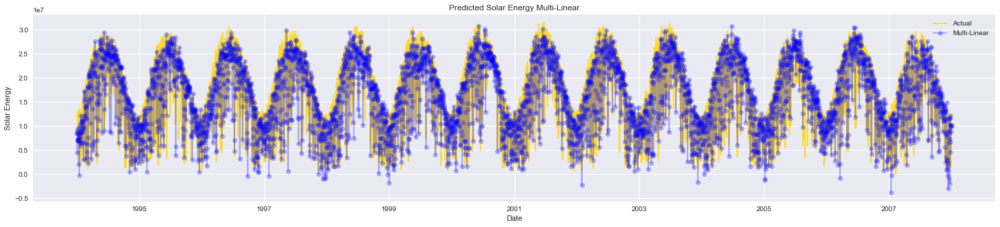

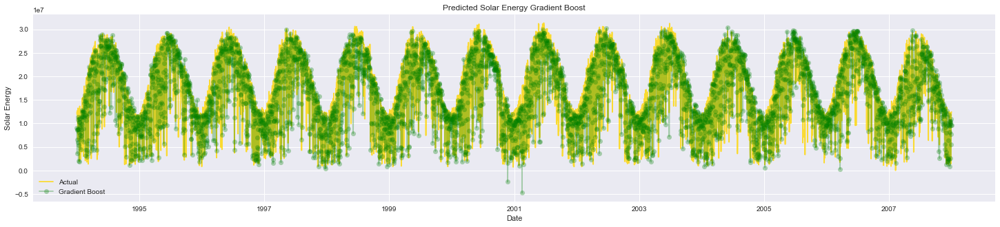

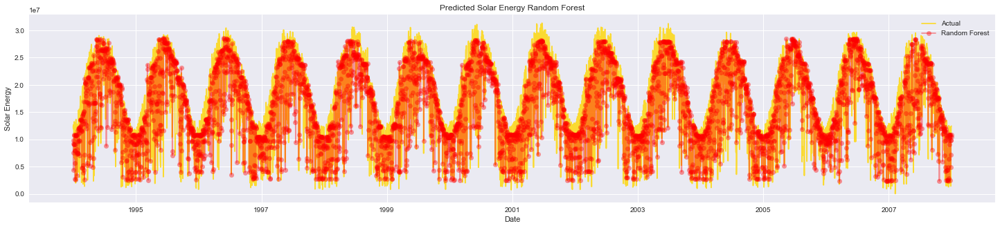

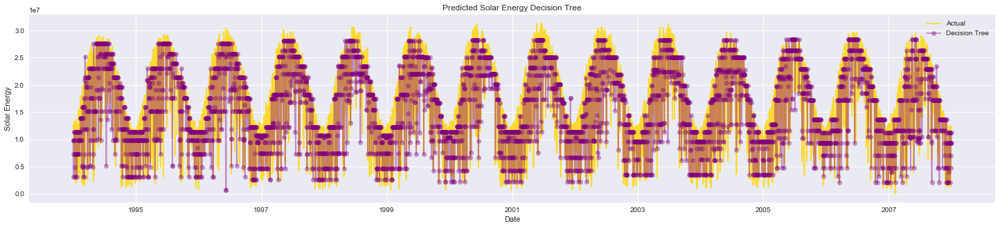

In [425]:
#Plot predicted versus actual to see how it looks

plt.figure(figsize=(25,5))
plt.plot(y.Date, y.ACME, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, mlr_pred, marker='o', color='blue', alpha=0.3, label='Multi-Linear')
plt.ylabel('Solar Energy')
#xlim(pd.Timestamp('2014-01-01'), pd.Timestamp('2015-12-31'))
plt.xlabel('Date')
plt.title('Predicted Solar Energy Multi-Linear')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-mlr.png')
plt.show()

plt.figure(figsize=(25,5))
plt.plot(y.Date, y.ACME, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, gb_pred, marker='o', color='green', alpha=0.3, label='Gradient Boost')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.title('Predicted Solar Energy Gradient Boost')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

plt.figure(figsize=(25,5))
plt.plot(y.Date, y.ACME, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, rf_pred, marker='o', color='red', alpha=0.4, label='Random Forest')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.title('Predicted Solar Energy Random Forest')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-rf.png')
plt.show()

plt.figure(figsize=(25,5))
plt.plot(y.Date, y.ACME, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, dt_pred, marker='o', color='purple', alpha=0.4, label='Decision Tree')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.title('Predicted Solar Energy Decision Tree')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-dtc.png')
plt.show()


# Model run for all stations

Now that we have established that we can loop through one station we want to apply this to every station. The workflow below is designed to predict solar energy at each station over the entire period.

In [377]:
#First create dataframe so we can place all the r-square values generated for each model for each station

r2_all = pd.DataFrame(index=range(0,4),columns=station.stid)
#row[0] = r-squared for multi-linear regression
#row[1] = r-squared for decision tree
#row[2] = r-squared for random forest
#row[3] = r-squared for gradient boost

#Create dataframe for each model.  As we loop through each station we will generate a model prediction and append to Dataframe
mlr_train = pd.DataFrame(index=range(0,5113),columns=station.stid)
rf_train = pd.DataFrame(index=range(0,5113),columns=station.stid)
dt_train = pd.DataFrame(index=range(0,5113),columns=station.stid)
gb_train = pd.DataFrame(index=range(0,5113),columns=station.stid)

#After we iterate through every station we can look at the r2.

In [421]:
#Use for loop to iterate through each station and build four model predictions 
#then output rsquared and prediction to csv

#start timer
start = timeit.default_timer()

columns = station.stid

for i in range(0,len(station)):
#for i in range(0,3):
    
    #Let's call the function we created above but this time use generic station names.  
    sub_press, sub_temp, sub_temp2m, sub_tmin, sub_tmax, sub_dlwave, sub_dswave, sub_ulwave, sub_ulwave_atm, sub_uswave, sub_cloud, sub_precip, sub_pwat,sub_humid, sub_conden = station_feature(stn_press,
                      stn_temp,
                      stn_temp2m,
                      stn_tmin,
                      stn_tmax,
                      stn_dlwave,
                      stn_dswave,
                      stn_ulwave,
                      stn_ulwave_atm,
                      stn_uswave,
                      stn_cloud,
                      stn_precip,
                      stn_pwat,
                      stn_humid,
                      stn_conden,
                      stn_dict,0,5113,stid = station.stid[i]) #** #station.stid[0] = ACME.  Use staiton id to loop through each

    #define target variable
    mesonet = y[station.stid[i]][0:5113] #** #station.stid[0] = ACME, needs to be from 0:1704

    #define predictor variables
    X = pd.DataFrame({'press':sub_press,'temp':sub_temp,'temp2m':sub_temp2m,'tmin':sub_tmin,'tmax':sub_tmax,'dlwave':sub_dlwave,
                      'dswave':sub_dswave,'ulwave':sub_ulwave,'ulwave_atm':sub_ulwave_atm,'uswave':sub_uswave,'cloud':sub_cloud,
                     'precip':sub_precip,'pwat':sub_pwat,'humid':sub_humid,'conden':sub_conden})

    #Standardize variables
    ss = StandardScaler()
    Xs = ss.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(Xs, mesonet, test_size=0.9)

    #Using Multi-linear regression
    mlr = LinearRegression()
    mlr.fit(X_train, y_train)
    mlr_pred = cross_val_predict(mlr, Xs, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Decision Tree
    dtc = DecisionTreeRegressor(max_depth=5, max_features='auto')
    dtc.fit(X_train, y_train)
    dt_pred = cross_val_predict(dtc, Xs, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Random Forest
    rf = RandomForestRegressor(n_estimators=100,max_depth=5)
    rf.fit(X_train, y_train)
    rf_pred = cross_val_predict(rf, Xs, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Gradient Boost with incorporated tuning parameters from gridsearch
    gb = GradientBoostingRegressor(loss='ls', learning_rate=0.08, n_estimators=50, subsample=1.0, 
                          criterion='friedman_mse', min_samples_split=25, min_samples_leaf=25, 
                          min_weight_fraction_leaf=0.0, max_depth=5, min_impurity_split=1e-07, 
                          init=None, random_state=None, max_features=None, alpha=0.8, verbose=0, 
                          max_leaf_nodes=None, warm_start=False, presort='auto')
    
    gb.fit(X_train, y_train)
    gb_pred = cross_val_predict(gb, Xs, mesonet, cv=5) #Create prediction for each file

    #Append prediction to DataFrame
    mlr_train[station.stid[i]] = mlr_pred
    rf_train[station.stid[i]] = rf_pred
    dt_train[station.stid[i]] = dt_pred
    gb_train[station.stid[i]] = gb_pred

    #Display r-squared scores for each model
    print station.stid[i] +' Multi-Linear Regression'
    r2_mlr = cross_val_score(mlr, X_test, y_test).mean()
    print r2_mlr
    print station.stid[i] + ' Decision Tree Regressor'
    r2_dt = cross_val_score(dtc, X_test, y_test).mean()
    print r2_dt
    print station.stid[i] + ' Random Forest Regressor'
    r2_rf = cross_val_score(rf, X_test, y_test).mean()
    print r2_rf
    print station.stid[i] + ' Gradient Boost Regressor'
    r2_gb = cross_val_score(gb, X_test, y_test).mean()
    print r2_gb

    #Append score rsquared for each model to the r2_all dataframe
    r2_all[station.stid[i]] = [r2_mlr, r2_dt, r2_rf, r2_gb]

    #Write the data frames to csv
    r2_all.to_csv('r2_all.csv', index=False)
    mlr_train.to_csv('mlr_train.csv', index=False)
    dt_train.to_csv('dt_train.csv', index=False)
    rf_train.to_csv('rf_train.csv', index=False)
    gb_train.to_csv('gb_train.csv', index=False)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

ACME Multi-Linear Regression
0.774644460229
ACME Decision Tree Regressor
0.729123600355
ACME Random Forest Regressor
0.763191781634
ACME Gradient Boost Regressor
0.782101176565
ADAX Multi-Linear Regression
0.777868644821
ADAX Decision Tree Regressor
0.751067083644
ADAX Random Forest Regressor
0.774852143012
ADAX Gradient Boost Regressor
0.789942376595
ALTU Multi-Linear Regression
0.751331603974
ALTU Decision Tree Regressor
0.711737622852
ALTU Random Forest Regressor
0.745954143071
ALTU Gradient Boost Regressor
0.760682435381
APAC Multi-Linear Regression
0.785366427717
APAC Decision Tree Regressor
0.754184036797
APAC Random Forest Regressor
0.777138954694
APAC Gradient Boost Regressor
0.800936911046
ARNE Multi-Linear Regression
0.799431031573
ARNE Decision Tree Regressor
0.770925202255
ARNE Random Forest Regressor
0.799939186265
ARNE Gradient Boost Regressor
0.827467015722
BEAV Multi-Linear Regression
0.783919632433
BEAV Decision Tree Regressor
0.744531256946
BEAV Random Forest Regresso

In [424]:
#The above took 1475s (~25 minutes to run)
gb_train.describe()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,...,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03
mean,1.686502e+07,1.621155e+07,1.710030e+07,1.702041e+07,1.754505e+07,1.758482e+07,1.727563e+07,1.594067e+07,1.603634e+07,1.865860e+07,...,1.570540e+07,1.662936e+07,1.693427e+07,1.702198e+07,1.705112e+07,1.527028e+07,1.594597e+07,1.563319e+07,1.743001e+07,1.609086e+07
std,7.058342e+06,7.079643e+06,6.802534e+06,7.098131e+06,7.248089e+06,7.141913e+06,7.151537e+06,7.186816e+06,6.904745e+06,7.004698e+06,...,7.115089e+06,7.023500e+06,7.091312e+06,7.033589e+06,7.012243e+06,7.011307e+06,7.056767e+06,7.052047e+06,7.288013e+06,7.228198e+06
min,9.588101e+05,1.857624e+05,-1.239197e+06,1.380161e+06,8.788419e+05,1.382214e+06,9.917687e+05,3.796659e+05,7.251355e+05,2.767047e+06,...,6.515920e+05,4.726187e+05,7.222971e+04,1.184566e+06,1.253025e+06,5.921573e+05,5.788698e+05,1.204829e+05,9.679033e+05,-4.769288e+06
25%,1.163717e+07,1.094450e+07,1.205109e+07,1.172702e+07,1.175801e+07,1.160716e+07,1.168501e+07,1.046805e+07,1.058418e+07,1.249928e+07,...,1.016301e+07,1.142491e+07,1.165794e+07,1.196358e+07,1.184745e+07,1.005665e+07,1.066763e+07,1.023230e+07,1.154283e+07,1.046813e+07
50%,1.677533e+07,1.618432e+07,1.714864e+07,1.678950e+07,1.733422e+07,1.745065e+07,1.716884e+07,1.550900e+07,1.601330e+07,1.885748e+07,...,1.550336e+07,1.666045e+07,1.654520e+07,1.722354e+07,1.662235e+07,1.510561e+07,1.585460e+07,1.580495e+07,1.714202e+07,1.602937e+07
75%,2.303092e+07,2.228686e+07,2.295595e+07,2.351126e+07,2.397668e+07,2.408649e+07,2.366138e+07,2.233224e+07,2.213241e+07,2.502011e+07,...,2.195036e+07,2.261725e+07,2.323557e+07,2.334992e+07,2.332721e+07,2.105230e+07,2.176927e+07,2.166354e+07,2.392684e+07,2.241458e+07
max,2.973316e+07,2.987518e+07,3.001197e+07,3.142237e+07,3.132191e+07,3.092506e+07,3.057310e+07,3.115276e+07,2.984957e+07,3.221681e+07,...,3.002389e+07,3.062769e+07,3.082052e+07,2.962002e+07,3.049339e+07,3.042045e+07,3.078837e+07,2.971828e+07,3.119553e+07,3.040539e+07


In [963]:
mlr_train.describe()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,...,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03
mean,1.687568e+07,1.624148e+07,1.711723e+07,1.700839e+07,1.755349e+07,1.761413e+07,1.729370e+07,1.597826e+07,1.606446e+07,1.869241e+07,...,1.574329e+07,1.664809e+07,1.696325e+07,1.703600e+07,1.707495e+07,1.533352e+07,1.600615e+07,1.566604e+07,1.742042e+07,1.608587e+07
std,6.941247e+06,6.992534e+06,6.696576e+06,6.996497e+06,7.099453e+06,7.011129e+06,7.042646e+06,7.110152e+06,6.789555e+06,6.891714e+06,...,7.012939e+06,6.920922e+06,6.997351e+06,6.898982e+06,6.934457e+06,6.875751e+06,7.001418e+06,6.967678e+06,7.148411e+06,7.127086e+06
min,-1.402891e+06,-3.035519e+06,-9.313603e+05,-1.051464e+06,-2.159364e+06,-1.294832e+06,-1.320014e+06,-3.558538e+06,-1.192339e+06,3.105825e+05,...,-4.879205e+06,-3.821463e+06,-2.136230e+06,-5.244773e+06,-2.456338e+06,-4.436819e+06,-6.543463e+06,-2.660824e+06,-2.474901e+06,-3.866456e+06
25%,1.131377e+07,1.092086e+07,1.172242e+07,1.135667e+07,1.164131e+07,1.157592e+07,1.152833e+07,1.040426e+07,1.046651e+07,1.264280e+07,...,1.018512e+07,1.135447e+07,1.119606e+07,1.175913e+07,1.140294e+07,1.016232e+07,1.057873e+07,1.027233e+07,1.142775e+07,1.038166e+07
50%,1.730633e+07,1.640036e+07,1.770328e+07,1.742653e+07,1.794113e+07,1.807511e+07,1.777993e+07,1.591431e+07,1.626562e+07,1.926668e+07,...,1.585978e+07,1.706547e+07,1.719761e+07,1.749862e+07,1.735635e+07,1.555955e+07,1.613898e+07,1.578937e+07,1.783796e+07,1.628585e+07
75%,2.291494e+07,2.235783e+07,2.296989e+07,2.310596e+07,2.371710e+07,2.384314e+07,2.342487e+07,2.228224e+07,2.209823e+07,2.458646e+07,...,2.196689e+07,2.272162e+07,2.314836e+07,2.305916e+07,2.314332e+07,2.121340e+07,2.207527e+07,2.164055e+07,2.371174e+07,2.241850e+07
max,3.105520e+07,3.181001e+07,3.196930e+07,3.141875e+07,3.388409e+07,3.205617e+07,3.318360e+07,3.303096e+07,3.079442e+07,3.331274e+07,...,3.087560e+07,3.076280e+07,3.192593e+07,3.117192e+07,3.264298e+07,2.996734e+07,3.229234e+07,3.157907e+07,3.339886e+07,3.069607e+07


In [964]:
dt_train.describe()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,...,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03
mean,1.689035e+07,1.622417e+07,1.712446e+07,1.699862e+07,1.757171e+07,1.762647e+07,1.733142e+07,1.593968e+07,1.608425e+07,1.868909e+07,...,1.571532e+07,1.662077e+07,1.695313e+07,1.703451e+07,1.706640e+07,1.530671e+07,1.600389e+07,1.564438e+07,1.742787e+07,1.606662e+07
std,6.964225e+06,6.988974e+06,6.742606e+06,6.989797e+06,7.113698e+06,7.064208e+06,7.060844e+06,7.114437e+06,6.817826e+06,6.867298e+06,...,7.019147e+06,6.925669e+06,6.994072e+06,6.949180e+06,6.944485e+06,6.921109e+06,6.950798e+06,6.952443e+06,7.144964e+06,7.146952e+06
min,2.664733e+06,2.243135e+06,2.700340e+06,3.038588e+06,3.002060e+06,1.370400e+06,2.342055e+06,2.806882e+06,2.369889e+06,3.533800e+06,...,5.553000e+05,3.165857e+06,2.619900e+06,2.326834e+06,3.000450e+06,2.543617e+06,2.412250e+06,2.373257e+06,2.743447e+06,6.474000e+05
25%,1.168781e+07,1.123575e+07,1.224126e+07,1.151285e+07,1.175154e+07,1.125972e+07,1.180970e+07,1.049526e+07,1.043482e+07,1.202600e+07,...,1.001106e+07,1.071788e+07,1.193225e+07,1.175478e+07,1.182954e+07,9.613275e+06,1.010827e+07,1.015934e+07,1.163546e+07,1.041362e+07
50%,1.735321e+07,1.632444e+07,1.737607e+07,1.722321e+07,1.703149e+07,1.714241e+07,1.725841e+07,1.551238e+07,1.652024e+07,1.914586e+07,...,1.544884e+07,1.706298e+07,1.676455e+07,1.714596e+07,1.678557e+07,1.565259e+07,1.609437e+07,1.620462e+07,1.642388e+07,1.670338e+07
75%,2.276809e+07,2.298857e+07,2.278831e+07,2.325179e+07,2.409866e+07,2.412702e+07,2.378381e+07,2.243762e+07,2.178159e+07,2.508347e+07,...,2.168182e+07,2.234101e+07,2.305000e+07,2.321066e+07,2.340028e+07,2.156712e+07,2.169374e+07,2.154102e+07,2.404948e+07,2.237425e+07
max,2.802533e+07,2.939226e+07,2.854511e+07,2.908818e+07,2.975064e+07,3.010965e+07,3.005212e+07,2.960469e+07,2.741262e+07,2.983503e+07,...,2.900160e+07,3.070168e+07,2.967497e+07,2.915780e+07,2.900121e+07,2.935989e+07,3.132369e+07,2.947721e+07,2.958605e+07,2.838529e+07


In [965]:
rf_train.describe()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,...,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03,5.113000e+03
mean,1.686856e+07,1.622182e+07,1.712313e+07,1.699643e+07,1.756366e+07,1.760903e+07,1.730340e+07,1.595835e+07,1.606099e+07,1.868466e+07,...,1.572950e+07,1.663957e+07,1.695639e+07,1.703703e+07,1.705860e+07,1.532216e+07,1.600318e+07,1.564686e+07,1.742050e+07,1.609400e+07
std,6.834245e+06,6.899963e+06,6.598255e+06,6.885766e+06,6.990500e+06,6.910528e+06,6.928382e+06,6.997343e+06,6.692295e+06,6.775224e+06,...,6.930478e+06,6.833037e+06,6.895368e+06,6.824948e+06,6.838629e+06,6.800619e+06,6.866323e+06,6.847181e+06,7.015161e+06,7.026105e+06
min,2.671188e+06,2.554461e+06,3.067157e+06,2.861489e+06,3.256880e+06,3.462732e+06,2.844755e+06,2.857165e+06,2.629666e+06,4.950923e+06,...,2.564036e+06,2.858175e+06,3.096055e+06,2.847217e+06,3.187708e+06,2.485495e+06,2.744082e+06,2.776722e+06,3.232738e+06,2.292271e+06
25%,1.172763e+07,1.123258e+07,1.203178e+07,1.174782e+07,1.183062e+07,1.140150e+07,1.161989e+07,1.066957e+07,1.060268e+07,1.235104e+07,...,1.032267e+07,1.151458e+07,1.180814e+07,1.189114e+07,1.188600e+07,1.012798e+07,1.083524e+07,1.042027e+07,1.155705e+07,1.065201e+07
50%,1.714141e+07,1.621616e+07,1.729298e+07,1.707857e+07,1.717769e+07,1.748304e+07,1.714898e+07,1.540806e+07,1.613695e+07,1.889323e+07,...,1.521092e+07,1.677067e+07,1.666542e+07,1.723503e+07,1.677251e+07,1.544363e+07,1.602709e+07,1.629726e+07,1.698135e+07,1.619705e+07
75%,2.281720e+07,2.257408e+07,2.314908e+07,2.338769e+07,2.384540e+07,2.394137e+07,2.359556e+07,2.230113e+07,2.214857e+07,2.503288e+07,...,2.201106e+07,2.252358e+07,2.314477e+07,2.328291e+07,2.322822e+07,2.136807e+07,2.178214e+07,2.167378e+07,2.370912e+07,2.243663e+07
max,2.831607e+07,2.911209e+07,2.819574e+07,2.869569e+07,2.946434e+07,2.895544e+07,2.924986e+07,2.908988e+07,2.736347e+07,3.010610e+07,...,2.827957e+07,2.896599e+07,2.884297e+07,2.879216e+07,2.896245e+07,2.876593e+07,2.982433e+07,2.879349e+07,2.932428e+07,2.857531e+07


In [426]:
r2_all

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
0,0.774644,0.777869,0.751332,0.785366,0.799431,0.783920,0.795055,0.775536,0.757025,0.809894,...,0.765240,0.748585,0.785314,0.789907,0.810482,0.735508,0.774340,0.772062,0.789572,0.782232
1,0.729124,0.751067,0.711738,0.754184,0.770925,0.744531,0.760818,0.733725,0.718973,0.771228,...,0.733468,0.715040,0.750940,0.773859,0.782380,0.712272,0.731906,0.737063,0.750080,0.744901
2,0.763192,0.774852,0.745954,0.777139,0.799939,0.779698,0.790595,0.767148,0.748450,0.803248,...,0.759934,0.742128,0.775589,0.795028,0.807780,0.735210,0.761895,0.757208,0.786961,0.773169
3,0.782101,0.789942,0.760682,0.800937,0.827467,0.805988,0.810064,0.786175,0.763422,0.819569,...,0.774684,0.755743,0.798186,0.817905,0.825627,0.747388,0.779171,0.775418,0.815231,0.790678


### Comment
Ok so we now have a successful preciction run of four predictive models

# Now Perform Principal Component Analysis
We want to see if there are any features we can drop to reduce dimensionality. For every feature we drop that will eliminate an array of 5113 in length which should help with the computing.

In [ ]:
#Principal Component analysis. Do we need all the variables?

from sklearn.decomposition import PCA

In [463]:
#Recall our standard scalar from above
# ss = StandardScaler()
feat_cont_n = ss.fit_transform(X)

feat_pca = PCA().fit(feat_cont_n)

feat_pcs = feat_pca.transform(feat_cont_n)
feat_pcs = pd.DataFrame(feat_pcs, 
                        columns=['PC'+str(i) for i in range(1, feat_pcs.shape[1]+1)])

feat_pcs.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,2.896788,-0.726378,-0.778130,-0.138272,0.394648,0.309545,-0.093462,0.094199,0.044100,0.009049,-0.349380,0.021785,-0.058777,0.061142,-0.010334
1,3.142266,1.692403,-1.420553,0.018351,-0.708643,0.100545,-0.015630,-0.084056,-0.030065,-0.098204,0.143233,0.050240,-0.074173,-0.009471,-0.000035
2,4.675111,-0.992065,-0.449890,0.244676,0.199654,-0.250557,0.309089,-0.292027,-0.092400,0.164397,-0.120792,-0.061632,0.104337,-0.085570,0.021409
3,4.361768,-0.807650,-0.430082,-0.495085,0.511110,0.253839,0.088094,-0.075682,-0.172932,-0.053860,-0.250174,0.043899,-0.033682,0.015826,0.011168
4,2.871051,-0.362950,-1.699901,1.020272,-0.094135,-0.428556,0.151154,-0.523436,0.121687,0.376524,0.221272,-0.144507,0.032058,0.088330,0.005115


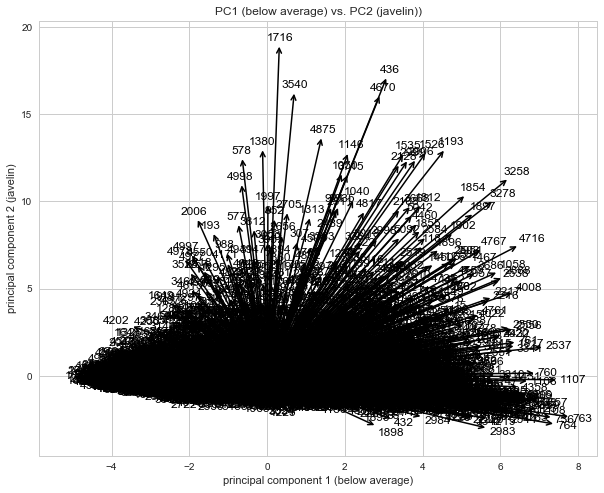

In [748]:
#Not really telling us much
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(feat_pcs.PC1.values, feat_pcs.PC2.values, s=0)

for i, txt in enumerate(feat_pcs.index.values):
    ax.annotate(txt, (0, 0), (feat_pcs.PC1.values[i], feat_pcs.PC2.values[i]),
            arrowprops=dict(arrowstyle='<-', color='black', linewidth=1.5),
            xycoords='data', textcoords='data', fontsize=12, color="black")

ax.set_title('PC1 (below average) vs. PC2 (javelin))')
ax.set_xlabel('principal component 1 (below average)')
ax.set_ylabel('principal component 2 (javelin)')
plt.show()

In [743]:
#Let's see if we can see any dominant features.  It's not so obvious
pd.Series(feat_pca.components_[0], index=X.columns)

cloud         0.067687
conden        0.067300
dlwave       -0.297007
dswave       -0.252481
humid        -0.315650
precip        0.009658
press         0.191115
pwat         -0.274476
temp         -0.334906
temp2m       -0.334403
tmax         -0.333079
tmin         -0.324853
ulwave       -0.334916
ulwave_atm   -0.197911
uswave       -0.188528
dtype: float64

## Comment
I was hoping that by viewing the specific prinicpal components we would be able to see if there were any features that had major contributions.  This isn't the case.  The only we could possibly do is take one temperature feature and two wave length features

In [744]:
pd.Series(feat_pca.components_[1], index=X.columns)

cloud         0.475065
conden        0.474984
dlwave        0.211901
dswave       -0.248719
humid         0.114810
precip        0.387846
press        -0.138236
pwat          0.219028
temp          0.030261
temp2m        0.020499
tmax          0.011688
tmin          0.101860
ulwave        0.037560
ulwave_atm   -0.316011
uswave       -0.313257
dtype: float64

In [745]:
pd.Series(feat_pca.components_[2], index=X.columns)

cloud         0.219840
conden        0.220616
dlwave       -0.083243
dswave        0.392282
humid         0.042671
precip        0.297641
press         0.608949
pwat          0.066528
temp          0.015147
temp2m       -0.003858
tmax         -0.027343
tmin         -0.100745
ulwave        0.001726
ulwave_atm   -0.078695
uswave        0.509108
dtype: float64

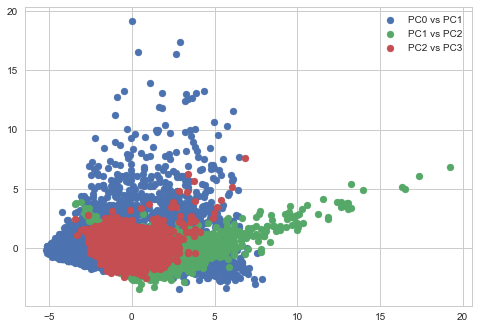

In [1003]:
plt.scatter(feat_pcs.PC1,feat_pcs.PC2, label = 'PC0 vs PC1')
plt.scatter(feat_pcs.PC2,feat_pcs.PC3,label = 'PC1 vs PC2')
plt.scatter(feat_pcs.PC3,feat_pcs.PC4, label = 'PC2 vs PC3')
plt.legend()
plt.show()

# The plot below is not so convincing in identifying specific features within our principal components

## Dimensionality Reduction

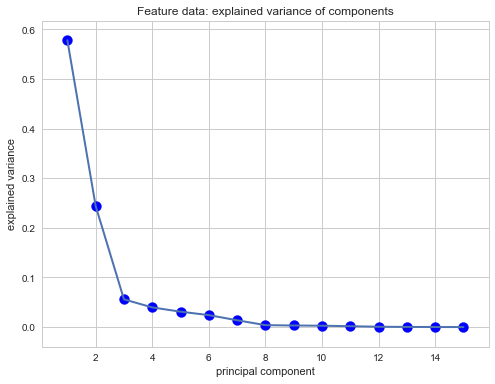

In [1002]:
# Elbow plot of principal components

fig, ax = plt.subplots(figsize=(8,6))
ax.plot(range(1, X.shape[1]+1), feat_pca.explained_variance_ratio_, lw=2)
ax.scatter(range(1, X.shape[1]+1), feat_pca.explained_variance_ratio_, color= 'blue', s=100)
ax.set_title('Feature data: explained variance of components')
ax.set_xlabel('principal component')
ax.set_ylabel('explained variance')
plt.show()



In [465]:
#Cumulative Variance explains
var1=np.cumsum(np.round(feat_pca.explained_variance_ratio_, decimals=5)*100)
print var1

[  57.826   82.239   87.832   91.803   94.911   97.326   98.704   99.097
   99.42    99.698   99.878   99.946   99.983  100.001  100.002]


### Comment
The elbow plot above indicates that after PC 3 there is a drastic reduction in improvement.  Let's rerun the model using only the first three principal components

In [752]:
#Redefine predcitor varaibles 
X_reduce = feat_pcs.iloc[:,0:3]
print len(X_reduce)
X_reduce.head()

5113


,PC1,PC2,PC3
0,2.896788,-0.726378,-0.778130
1,3.142266,1.692403,-1.420553
2,4.675111,-0.992065,-0.449890
3,4.361768,-0.807650,-0.430082
4,2.871051,-0.362950,-1.699901


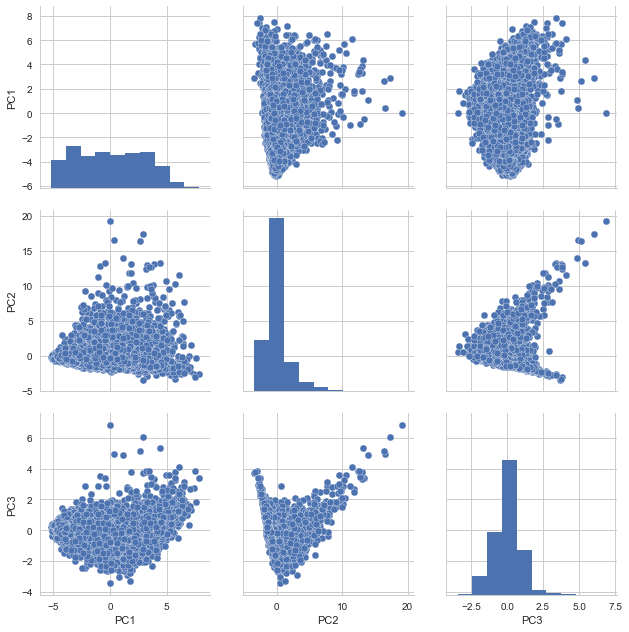

In [755]:
sns.pairplot(data=X_reduce, vars=['PC1','PC2','PC3'], size=3);
plt.show()

## Comment
The explained variance of components and cumulative variance both indicate that PC1-PC3 are the major contributors so we can drop PC4 thru PC15 to reduce dimensionality since they have negligable contributions which is nearly half the feature data!

Unfortunately we can't really see the makor contributing features within each component.

# Re-Run Model Using Reduced Dimensionality

In [735]:
#Redefine predcitor varaibles 
X_reduce = feat_pcs.iloc[:,0:3]
print len(X_reduce)
X_reduce.head()


5113


,PC1,PC2,PC3
0,2.896788,-0.726378,-0.778130
1,3.142266,1.692403,-1.420553
2,4.675111,-0.992065,-0.449890
3,4.361768,-0.807650,-0.430082
4,2.871051,-0.362950,-1.699901


In [736]:
#First create dataframe so we can place all the r-square values generated for each model for each station

r2_pca = pd.DataFrame(index=range(0,4),columns=station.stid)
#row[0] = r-squared for multi-linear regression
#row[1] = r-squared for decision tree
#row[2] = r-squared for random forest
#row[3] = r-squared for gradient boost

#Create dataframe for each model.  As we loop through each station we will generate a model prediciton and append to Dataframe
mlr_train_pca = pd.DataFrame(index=range(0,5113),columns=station.stid)
rf_train_pca = pd.DataFrame(index=range(0,5113),columns=station.stid)
dt_train_pca = pd.DataFrame(index=range(0,5113),columns=station.stid)
gb_train_pca = pd.DataFrame(index=range(0,5113),columns=station.stid)

#After we iterate through every station we can look at the r2.

In [738]:
#Use for loop to iterate through each station and build four model predictions then output rsquared and prediction to csv

#start timer
start = timeit.default_timer()

columns = station.stid

for i in range(0,len(station)):
#for i in range(0,3):
    
    #Let's call the function we created above but this time use generic station names.  
    sub_press, sub_temp, sub_temp2m, sub_tmin, sub_tmax, sub_dlwave, sub_dswave, sub_ulwave, sub_ulwave_atm, sub_uswave, sub_cloud, sub_precip, sub_pwat,sub_humid, sub_conden = station_feature(stn_press,
                      stn_temp,
                      stn_temp2m,
                      stn_tmin,
                      stn_tmax,
                      stn_dlwave,
                      stn_dswave,
                      stn_ulwave,
                      stn_ulwave_atm,
                      stn_uswave,
                      stn_cloud,
                      stn_precip,
                      stn_pwat,
                      stn_humid,
                      stn_conden,
                      stn_dict,0,5113,stid = station.stid[i]) #** #station.stid[0] = ACME.  Use staiton id to loop through each

    #define target variable
    mesonet = y[station.stid[i]][0:5113] #** #station.stid[0] = ACME, needs to be from 0:1704

    #define predictor variables
    X = pd.DataFrame({'press':sub_press,'temp':sub_temp,'temp2m':sub_temp2m,'tmin':sub_tmin,'tmax':sub_tmax,'dlwave':sub_dlwave,
                      'dswave':sub_dswave,'ulwave':sub_ulwave,'ulwave_atm':sub_ulwave_atm,'uswave':sub_uswave,'cloud':sub_cloud,
                     'precip':sub_precip,'pwat':sub_pwat,'humid':sub_humid,'conden':sub_conden})

    #Standardize variables
    ss = StandardScaler()
    feat_cont_n = ss.fit_transform(X)
    
    #Convert predictors to Principal Components
    feat_pca = PCA().fit(feat_cont_n)
    feat_pcs = feat_pca.transform(feat_cont_n)
    feat_pcs = pd.DataFrame(feat_pcs, 
                        columns=['PC'+str(n) for n in range(1, feat_pcs.shape[1]+1)])
    
    #From PCA above we can reduce dimensionality to use PC1-PC9. Drop PC10 - PC15 
    X_reduce = feat_pcs.iloc[:,0:9]
    
    #Divide into test/train split using reduced principal components
    X_train, X_test, y_train, y_test = train_test_split(X_reduce, mesonet, test_size=0.9)

    #Using Multi-linear regression
    mlr = LinearRegression()
    mlr.fit(X_train, y_train)
    mlr_pred = cross_val_predict(mlr, X_reduce, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Decision Tree
    dtc = DecisionTreeRegressor(max_depth=5, max_features='auto')
    dtc.fit(X_train, y_train)
    dt_pred = cross_val_predict(dtc, X_reduce, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Random Forest
    rf = RandomForestRegressor(n_estimators=100,max_depth=5)
    rf.fit(X_train, y_train)
    rf_pred = cross_val_predict(rf, X_reduce, mesonet, cv=5) #Create prediction for each file
    #********************************
    #Using Gradient Boost
    gb = GradientBoostingRegressor(loss='ls', learning_rate=0.08, n_estimators=50, subsample=1.0, 
                          criterion='friedman_mse', min_samples_split=25, min_samples_leaf=25, 
                          min_weight_fraction_leaf=0.0, max_depth=5, min_impurity_split=1e-07, 
                          init=None, random_state=None, max_features=None, alpha=0.8, verbose=0, 
                          max_leaf_nodes=None, warm_start=False, presort='auto')
    
    gb.fit(X_train, y_train)
    gb_pred = cross_val_predict(gb, X_reduce, mesonet, cv=5) #Create prediction for each file

    #Append prediction to DataFrame
    mlr_train_pca[station.stid[i]] = mlr_pred
    rf_train_pca[station.stid[i]] = rf_pred
    dt_train_pca[station.stid[i]] = dt_pred
    gb_train_pca[station.stid[i]] = gb_pred

    #Display r-squared scores for each model
    print station.stid[i] +' Multi-Linear Regression'
    r2_mlr = cross_val_score(mlr, X_test, y_test).mean()
    print r2_mlr
    print station.stid[i] + ' Decision Tree Regressor'
    r2_dt = cross_val_score(dtc, X_test, y_test).mean()
    print r2_dt
    print station.stid[i] + ' Random Forest Regressor'
    r2_rf = cross_val_score(rf, X_test, y_test).mean()
    print r2_rf
    print station.stid[i] + ' Gradient Boost Regressor'
    r2_gb = cross_val_score(gb, X_test, y_test).mean()
    print r2_gb

    #Append score rsquared for each model to the r2_all dataframe
    r2_pca[station.stid[i]] = [r2_mlr, r2_dt, r2_rf, r2_gb]

    #Write the two data frames to csv
    r2_pca.to_csv('r2_pca.csv', index=False)
    mlr_train_pca.to_csv('mlr_train_pca.csv', index=False)
    dt_train_pca.to_csv('dt_train_pca.csv', index=False)
    rf_train_pca.to_csv('rf_train_pca.csv', index=False)
    gb_train_pca.to_csv('gb_train_pca.csv', index=False)

stop = timeit.default_timer()
print "Time: %d s" % (stop - start)

ACME Multi-Linear Regression
0.769828620367
ACME Decision Tree Regressor
0.678018601657
ACME Random Forest Regressor
0.739535539126
ACME Gradient Boost Regressor
0.777553800115
ADAX Multi-Linear Regression
0.765885435972
ADAX Decision Tree Regressor
0.690557805726
ADAX Random Forest Regressor
0.749382513326
ADAX Gradient Boost Regressor
0.778088281254
ALTU Multi-Linear Regression
0.743537689888
ALTU Decision Tree Regressor
0.661391012401
ALTU Random Forest Regressor
0.722450785862
ALTU Gradient Boost Regressor
0.749433035394
APAC Multi-Linear Regression
0.77606389164
APAC Decision Tree Regressor
0.681463496645
APAC Random Forest Regressor
0.747034605392
APAC Gradient Boost Regressor
0.784695652212
ARNE Multi-Linear Regression
0.793560695848
ARNE Decision Tree Regressor
0.717440089097
ARNE Random Forest Regressor
0.776282912747
ARNE Gradient Boost Regressor
0.808365724412
BEAV Multi-Linear Regression
0.77950187924
BEAV Decision Tree Regressor
0.714468830717
BEAV Random Forest Regressor


In [756]:
mesonet.head()
# len(gb_train_pca)
# len(gb_pred)
# len(mesonet)
gb_train_pca.head()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
0,1.164621e+07,1.191496e+07,1.237321e+07,1.153826e+07,1.185750e+07,1.175880e+07,1.242511e+07,1.054981e+07,1.008972e+07,1.203108e+07,...,9.670656e+06,1.192174e+07,1.147410e+07,1.218176e+07,1.179776e+07,9.738960e+06,1.124071e+07,1.012546e+07,1.176216e+07,9.680645e+06
1,1.149832e+07,1.137812e+07,1.110598e+07,1.157193e+07,1.038342e+07,1.083332e+07,9.383570e+06,8.126580e+06,6.727566e+06,1.286648e+07,...,5.976520e+06,1.093607e+07,9.762212e+06,1.223859e+07,8.797411e+06,4.126024e+06,1.098824e+07,8.226202e+06,1.086318e+07,4.507244e+06
2,1.243145e+07,1.080268e+07,1.268456e+07,1.231322e+07,1.177781e+07,1.094476e+07,1.201956e+07,8.890826e+06,1.095120e+07,1.156518e+07,...,8.707804e+06,1.189485e+07,1.213008e+07,1.297954e+07,1.192887e+07,6.789936e+06,8.724048e+06,8.361798e+06,1.175356e+07,1.019096e+07
3,1.195646e+07,1.115643e+07,1.205775e+07,1.193671e+07,1.270107e+07,1.235188e+07,1.220563e+07,9.721863e+06,1.102989e+07,1.139086e+07,...,7.427951e+06,1.237801e+07,1.208638e+07,1.256799e+07,1.211851e+07,7.607380e+06,1.071418e+07,9.523007e+06,1.233559e+07,8.798406e+06
4,1.210236e+07,1.128336e+07,1.205268e+07,1.164367e+07,1.315262e+07,8.651128e+06,1.240786e+07,9.474320e+06,9.645162e+06,1.118795e+07,...,8.467057e+06,1.355279e+07,1.166794e+07,1.239357e+07,1.210614e+07,9.072503e+06,1.064814e+07,8.831277e+06,1.242019e+07,8.648619e+06


In [757]:
r2_pca.describe()

stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,0.741234,0.745979,0.719203,0.747314,0.773912,0.764933,0.770416,0.742490,0.718710,0.777747,...,0.734567,0.724522,0.754807,0.769165,0.775705,0.705008,0.731438,0.734795,0.763841,0.750987
std,0.045225,0.038774,0.040244,0.046763,0.039866,0.035177,0.037587,0.038765,0.045482,0.040472,...,0.039951,0.039367,0.036176,0.038409,0.036440,0.034386,0.041818,0.038132,0.036544,0.045139
min,0.678019,0.690558,0.661391,0.681463,0.717440,0.714469,0.715683,0.687823,0.654470,0.721431,...,0.677647,0.668634,0.704274,0.715311,0.725149,0.656677,0.673334,0.681479,0.713261,0.685966
25%,0.724156,0.734676,0.707186,0.730642,0.761572,0.756453,0.761346,0.729370,0.702469,0.762102,...,0.721546,0.711894,0.741038,0.758792,0.761355,0.692862,0.714794,0.720625,0.749703,0.738312
50%,0.754682,0.757634,0.732994,0.761549,0.784922,0.774975,0.783881,0.753495,0.734621,0.789288,...,0.747778,0.736221,0.765657,0.777831,0.785953,0.714855,0.744399,0.745710,0.773197,0.766007
75%,0.771760,0.768936,0.745012,0.778222,0.797262,0.783455,0.792951,0.766615,0.750862,0.804933,...,0.760800,0.748849,0.779427,0.788205,0.800303,0.727001,0.761043,0.759880,0.787335,0.778682
max,0.777554,0.778088,0.749433,0.784696,0.808366,0.795314,0.798218,0.775146,0.751127,0.810981,...,0.765065,0.757015,0.783639,0.805689,0.805765,0.733644,0.763621,0.766283,0.795710,0.785968


## Comment 

Computing time from first model run
Time: 1475 s

Computing time with PCA reduction
Time: 1087 s

388s (~6.5 minutes) difference in computing time 

Given computation computing time saves was not very much I'll just stick with the original

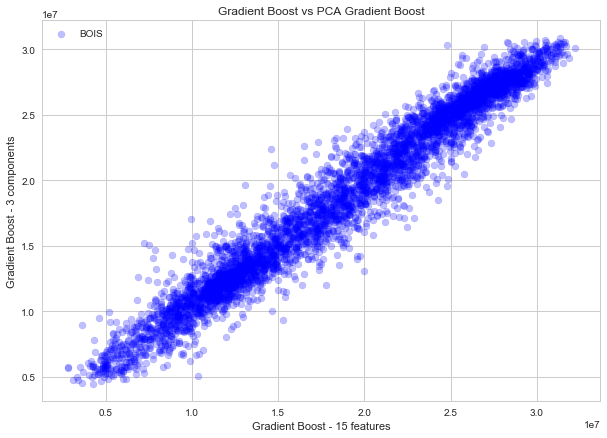

In [1007]:
#Compare Gradient Boost vs PCA Gradient Boost

plt.figure(figsize=(10,7))
plt.scatter(gb_train.BOIS, gb_train_pca.BOIS, alpha=0.25, color = 'blue')
#plt.plot(y.Date, gb_pred_pca, marker='o', color='green', alpha=0.3, label='Gradient Boost')
plt.ylabel('Gradient Boost - 3 components')
plt.xlabel('Gradient Boost - 15 features')
plt.title('Gradient Boost vs PCA Gradient Boost')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

## Comment
The above demonstrates that Gradient boosting with 3 principal components is producing the same result as gradient boosting with 15 features.

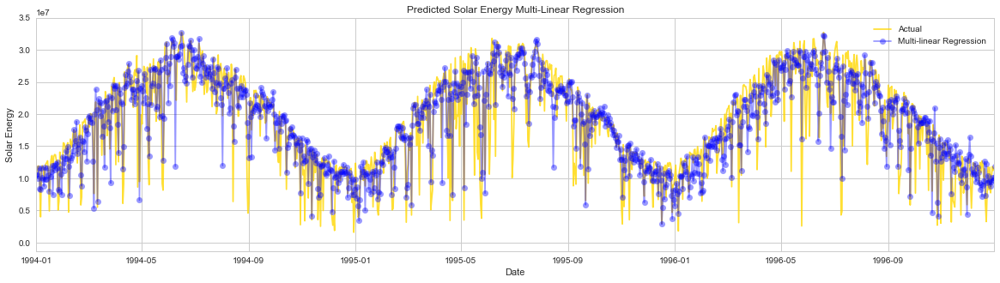

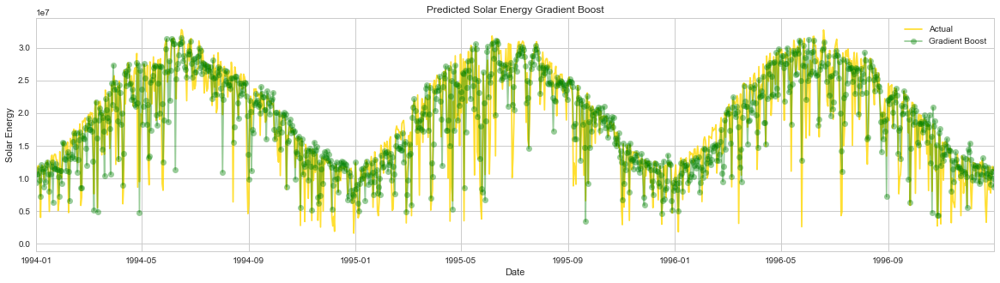

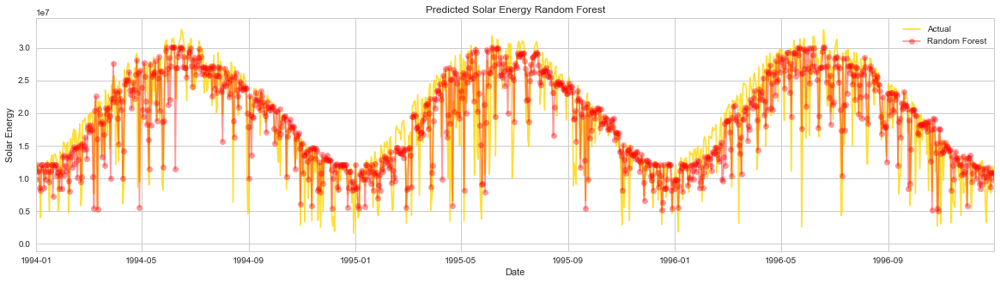

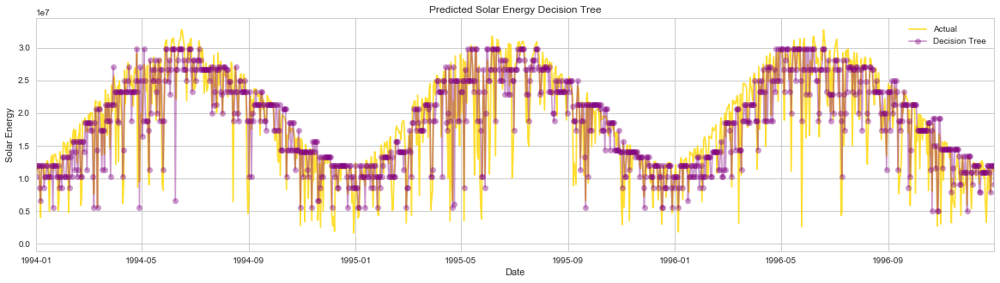

In [759]:
plt.figure(figsize=(20,5))
plt.plot(y.Date, y.BOIS, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, mlr_train.BOIS, marker='o', color='blue', alpha=0.4, label='Multi-linear Regression')
#plt.plot(y.Date, gb_train_pca.BOIS, marker='o', color='blue', alpha=0.3, label='Gradient Boost PCA')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.xlim(y.Date[0],y.Date[1095])
plt.title('Predicted Solar Energy Multi-Linear Regression')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

plt.figure(figsize=(20,5))
plt.plot(y.Date, y.BOIS, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, gb_train.BOIS, marker='o', color='green', alpha=0.4, label='Gradient Boost')
#plt.plot(y.Date, gb_train_pca.BOIS, marker='o', color='blue', alpha=0.3, label='Gradient Boost PCA')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.xlim(y.Date[0],y.Date[1095])
plt.title('Predicted Solar Energy Gradient Boost')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

plt.figure(figsize=(20,5))
plt.plot(y.Date, y.BOIS, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, rf_train.BOIS, marker='o', color='red', alpha=0.4, label='Random Forest')
#plt.plot(y.Date, gb_train_pca.BOIS, marker='o', color='blue', alpha=0.3, label='Gradient Boost PCA')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.xlim(y.Date[0],y.Date[1095])
plt.title('Predicted Solar Energy Random Forest')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

plt.figure(figsize=(20,5))
plt.plot(y.Date, y.BOIS, alpha=0.8, color = 'gold',label='Actual')
plt.plot(y.Date, dt_train.BOIS, marker='o', color='purple', alpha=0.4, label='Decision Tree')
#plt.plot(y.Date, gb_train_pca.BOIS, marker='o', color='blue', alpha=0.3, label='Gradient Boost PCA')
plt.ylabel('Solar Energy')
plt.xlabel('Date')
plt.xlim(y.Date[0],y.Date[1095])
plt.title('Predicted Solar Energy Decision Tree')
plt.legend()
#plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/ACME-gb.png')
plt.show()

## Comment
Zoomed in view of the prediction models over a two year time preiod.  Notice that the models are struggling at the high end.  Possibly due to sever weather like tornadoes resulting in under predicting.

In [760]:
#Calculate the mean r-squared for each method and add model type

r2_pca
r2_pca['Mean'] = r2_pca.mean(axis=1)
r2_col = ['Multi-Linear Reg', 'Decision Tree','Random Forest', 'Gradient Boost']
r2_pca['Type'] = r2_col

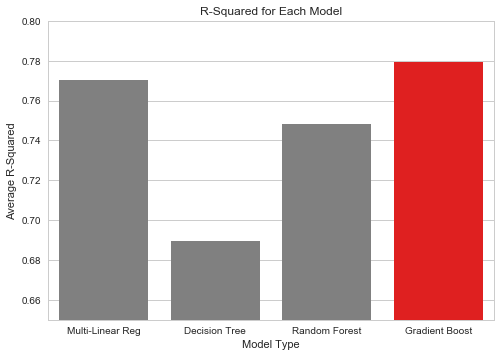

In [761]:
#Plot the mean r-squared for each model

#set all colors to grey unless max value
clrs = ['grey' if (x < max(r2_pca.Mean)) else 'red' for x in r2_pca.Mean ]
sns.set_style("whitegrid")

ax = sns.barplot(x=r2_pca.Type, y=r2_pca.Mean, data=r2_pca, palette=clrs)
plt.title('R-Squared for Each Model')
plt.xlabel('Model Type')
plt.ylim(0.65,0.8)
plt.ylabel('Average R-Squared')
plt.show()

#Credit: iayork
#https://stackoverflow.com/questions/31074758/how-to-set-a-different-color-to-the-largest-bar-in-a-seaborn-barplot

## Comment
The above barplot shows that gradient boost slightly outperforms multi-linear regression.  Decision tree is the worst performer.

In [785]:
#y['Mean'] = y.iloc[:,1:].mean()
mlr_train_pca.head()


stid,ACME,ADAX,ALTU,APAC,ARNE,BEAV,BESS,BIXB,BLAC,BOIS,...,VINI,WASH,WATO,WAUR,WEAT,WEST,WILB,WIST,WOOD,WYNO
0,1.020672e+07,1.048806e+07,1.121286e+07,1.039414e+07,1.040282e+07,1.067943e+07,1.111951e+07,1.033249e+07,9.497351e+06,1.097266e+07,...,8.963104e+06,1.046507e+07,1.058554e+07,1.091122e+07,1.076375e+07,9.523841e+06,1.044347e+07,9.972304e+06,1.017848e+07,9.474626e+06
1,9.929146e+06,9.254650e+06,1.039192e+07,1.001382e+07,8.856521e+06,9.253871e+06,7.630456e+06,7.025209e+06,5.715873e+06,1.091140e+07,...,4.630892e+06,9.723894e+06,7.552000e+06,1.040422e+07,7.780982e+06,4.655777e+06,9.228972e+06,8.915190e+06,8.545832e+06,4.579680e+06
2,1.068977e+07,9.310021e+06,1.124872e+07,1.075631e+07,1.101389e+07,9.716693e+06,1.085502e+07,8.896217e+06,9.227943e+06,1.049290e+07,...,8.415736e+06,1.030136e+07,1.077086e+07,1.060721e+07,1.094931e+07,6.419706e+06,8.669616e+06,8.733352e+06,1.084975e+07,8.374134e+06
3,1.094035e+07,1.050042e+07,1.075511e+07,1.109988e+07,1.108232e+07,1.127470e+07,1.060857e+07,8.445957e+06,9.712755e+06,1.135077e+07,...,6.644005e+06,1.111579e+07,1.079674e+07,1.115874e+07,1.092802e+07,7.597878e+06,9.737684e+06,9.261155e+06,1.097636e+07,7.851589e+06
4,1.146621e+07,1.014839e+07,1.256425e+07,1.143071e+07,1.214760e+07,9.680831e+06,1.301780e+07,8.667038e+06,8.584953e+06,8.174837e+06,...,7.860535e+06,1.102201e+07,1.148004e+07,1.170328e+07,1.178849e+07,8.796990e+06,9.617807e+06,8.969339e+06,1.170705e+07,8.098302e+06


In [1014]:
r2_pca.ix[2,:]

stid
ACME         0.739536
ADAX         0.749383
ALTU         0.722451
APAC         0.747035
ARNE         0.776283
BEAV         0.770448
BESS         0.776567
BIXB         0.743219
BLAC         0.718468
BOIS         0.775659
BOWL         0.765925
BREC          0.76563
BRIS         0.755145
BUFF         0.726786
BURB         0.749107
BURN         0.722957
BUTL         0.749557
BYAR         0.740853
CAMA         0.769375
CENT         0.756047
CHAN         0.749289
CHER         0.753532
CHEY         0.757164
CHIC         0.770773
CLAY         0.712328
CLOU          0.75517
COOK         0.749009
COPA         0.752689
DURA         0.737724
ELRE         0.756224
            ...      
PUTN         0.717431
REDR         0.752454
RETR         0.767826
RING         0.757496
SALL         0.759507
SEIL         0.728648
SHAW          0.77035
SKIA         0.760412
SLAP         0.705909
SPEN         0.732942
STIG         0.753868
STIL         0.755026
STUA         0.741882
SULP         0.754464
TAHL 

In [1012]:
#Now that fearture data is loaded let's swtich gears and load the station data
#Load mesonet location data
station_csv = ('/Users/gopetro/Documents/DSi/Materials/Capstone/solar_data/station_info.csv')
station = pd.read_csv(station_csv)
station.head()

#for stn in range(0,1):
sol_mean =[] # solar mean actual
sol_gb = [] # solar mean gradient boost
sol_mlr = [] # solar mean multi-linear regression
sol_rf = [] # solar mean random forest
sol_dt = [] # solar mean decision tree

for stn in range(0,len(station)):
    sol_mean.append(y[station.stid[stn]].mean())
    sol_gb.append(gb_train_pca[station.stid[stn]].mean())
    sol_mlr.append(mlr_train_pca[station.stid[stn]].mean())
    sol_rf.append(rf_train_pca[station.stid[stn]].mean())
    sol_dt.append(dt_train_pca[station.stid[stn]].mean())

station['solar_mean'] = sol_mean
station['gb_mean'] = sol_gb
station['mlr_mean'] = sol_mlr
station['rf_mean'] = sol_rf
station['dt_mean'] = sol_dt
station['r2_ave_gb'] = r2_pca.ix[2,:]

station.head()

,stid,latitude,longitude,elev,solar_mean,gb_mean,mlr_mean,rf_mean,dt_mean,r2_ave_gb
0,ACME,34.80833,261.97675,397,1.687746e+07,1.687628e+07,1.687619e+07,1.688967e+07,1.686431e+07,NaN
1,ADAX,34.79851,263.33091,295,1.623753e+07,1.624742e+07,1.623958e+07,1.624041e+07,1.624501e+07,NaN
2,ALTU,34.58722,260.66192,416,1.711919e+07,1.712498e+07,1.711811e+07,1.713013e+07,1.711992e+07,NaN
3,APAC,34.91418,261.70784,440,1.701057e+07,1.701152e+07,1.700809e+07,1.702317e+07,1.705537e+07,NaN
4,ARNE,36.07204,260.09692,719,1.756017e+07,1.755974e+07,1.755488e+07,1.757254e+07,1.754576e+07,NaN


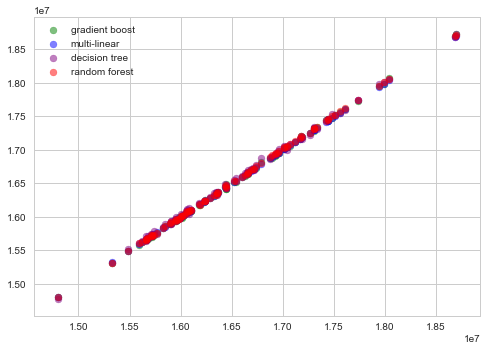

In [1018]:
plt.scatter(station.solar_mean,station.gb_mean,alpha=0.5, color='green', label = 'gradient boost')
plt.scatter(station.solar_mean,station.mlr_mean,alpha=0.5, color='blue', label = 'multi-linear')
plt.scatter(station.solar_mean,station.dt_mean,alpha=0.5, color='purple', label = 'decision tree')
plt.scatter(station.solar_mean,station.rf_mean,alpha=0.5, color='red', label = 'random forest' )
plt.legend()
plt.show()

#Taking the mean just tells us that all our predictions are very close. Doesn't really tell us much.

In [828]:
station.describe()

,latitude,longitude,elev,solar_mean,gb_mean,mlr_mean,rf_mean,dt_mean
count,98.000000,98.000000,98.000000,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01,9.800000e+01
mean,35.571678,262.567651,382.714286,1.652610e+07,1.652546e+07,1.652599e+07,1.653298e+07,1.654095e+07
std,0.892668,1.823683,213.047693,7.392346e+05,7.429395e+05,7.366497e+05,7.438144e+05,7.394303e+05
min,33.830130,257.121800,110.000000,1.479592e+07,1.480059e+07,1.480960e+07,1.480570e+07,1.477980e+07
25%,34.856380,261.276342,251.250000,1.597388e+07,1.596374e+07,1.597583e+07,1.596666e+07,1.597709e+07
50%,35.547315,262.779025,327.500000,1.640312e+07,1.639675e+07,1.640090e+07,1.640287e+07,1.640389e+07
75%,36.380547,263.992865,473.500000,1.703374e+07,1.703731e+07,1.703096e+07,1.704706e+07,1.705059e+07
max,36.987070,265.355040,1322.000000,1.870056e+07,1.872469e+07,1.869979e+07,1.872047e+07,1.873032e+07


In [967]:
#Export station dataframe with average solar energy to csv
station.longitude = station.longitude-360 
station.to_csv('station_with_solar_mean.csv', index=False)

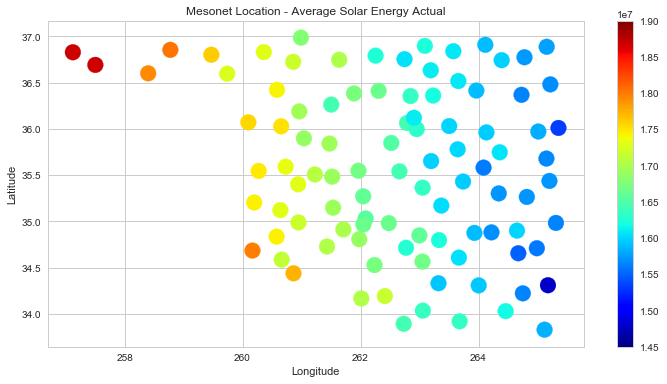

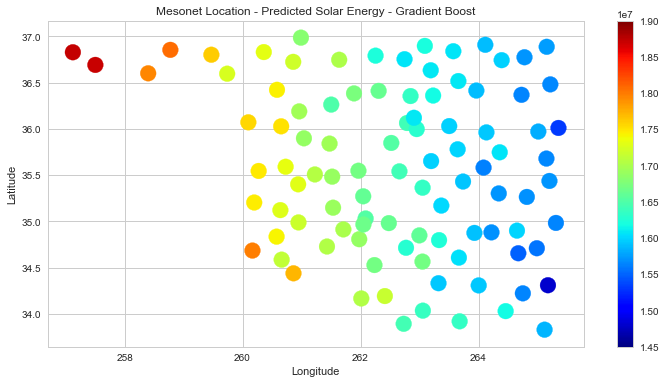

In [851]:
#plt.scatter(station.longitude, station.latitude, s=station.elev, marker='o')
import matplotlib.cm as cm
#plt.scatter(x, y, c=t, cmap='viridis')
#plt.colorbar()
#plt.show()
plt.figure(figsize=(12,6))
plt.scatter(station.longitude, station.latitude, c=station.solar_mean, s=250, cmap='jet')
plt.title('Mesonet Location - Average Solar Energy Actual')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar()
plt.clim(1.45e+07,1.9e+07)
plt.show()

plt.figure(figsize=(12,6))
plt.scatter(station.longitude, station.latitude, c=station.gb_mean, s=250, cmap='jet')
plt.title('Mesonet Location - Predicted Solar Energy - Gradient Boost')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar()
plt.clim(1.45e+07,1.9e+07)
plt.show()



### Comment
On a color map the average solar energy predicted is the same as actual.  What this shows is that the best location to put a solar farm would be in the north east corner.  However this solely based on solar energy and does not account for surface infra structure.

It should also be pointed out that the best locations are also the highest in elevation where the plot below is color map of elevation.

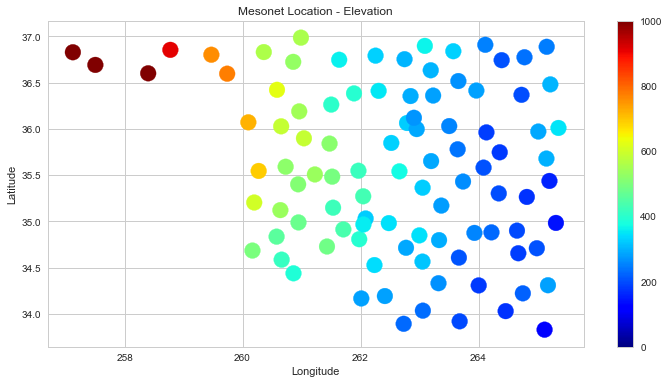

In [850]:
plt.figure(figsize=(12,6))
plt.scatter(station.longitude, station.latitude, c=station.elev,s=250, cmap='jet')
plt.title('Mesonet Location - Elevation')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar()
plt.clim(0,1000)
plt.show()

#Interestingly the elevation makes a huge difference.  

# Comment

When plotting a colormap across the regions our predicition shows we are in line with the actual energy prediction.

The data is saying that there is a relationship in solar energy and elevation.  The higher in elevation the more energy produced.

# Plots below were created as visuals only

Images to create Gifs

In [929]:
time_int = range(1,31*11,30)
print time_int

[1, 31, 61, 91, 121, 151, 181, 211, 241, 271, 301, 331]


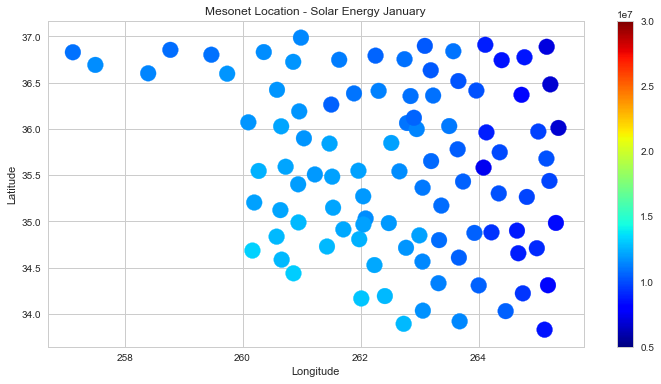

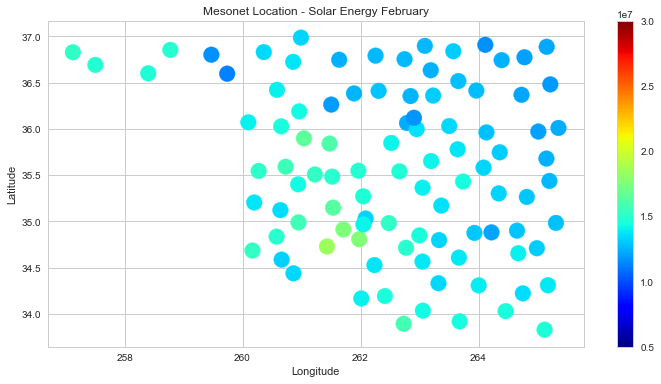

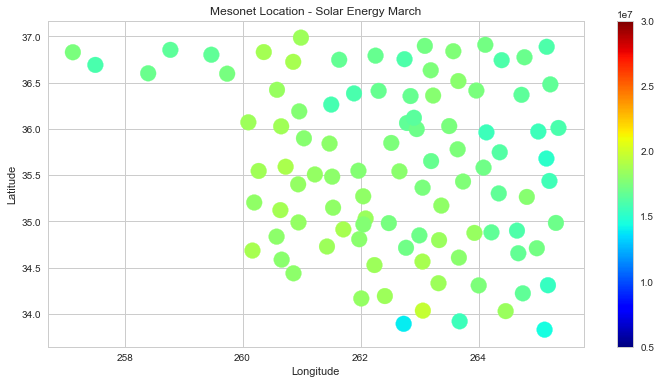

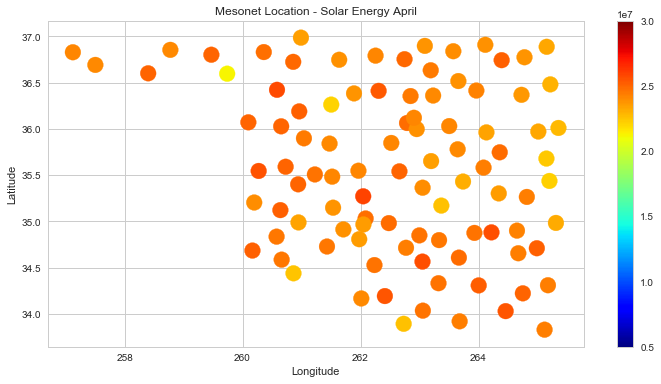

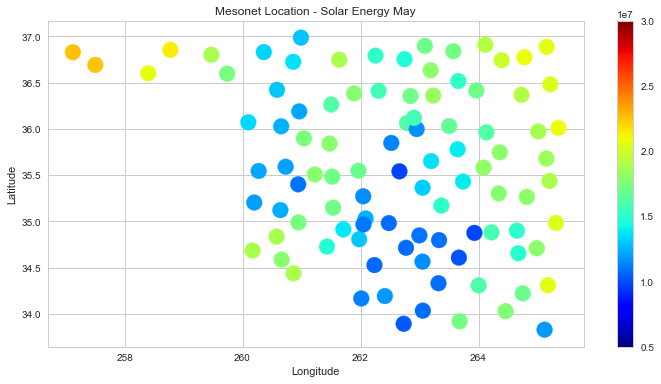

...

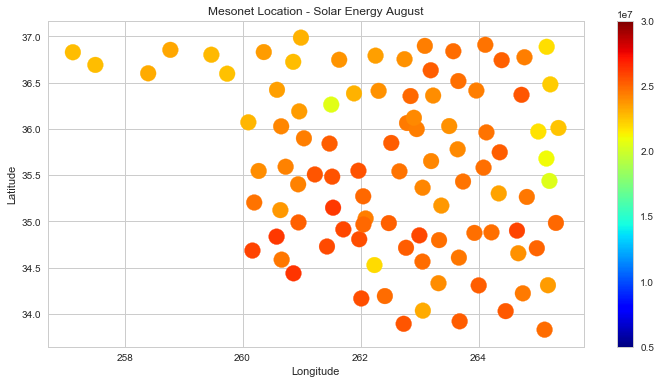

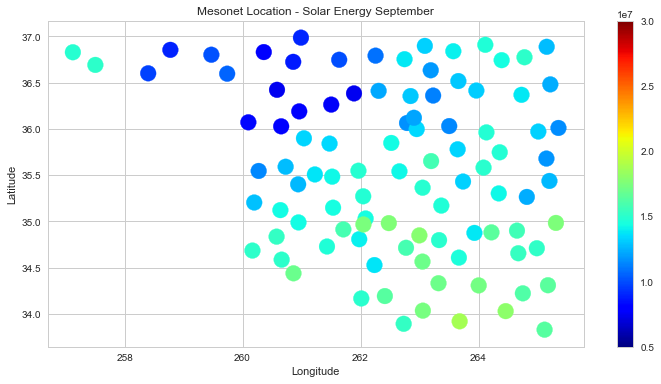

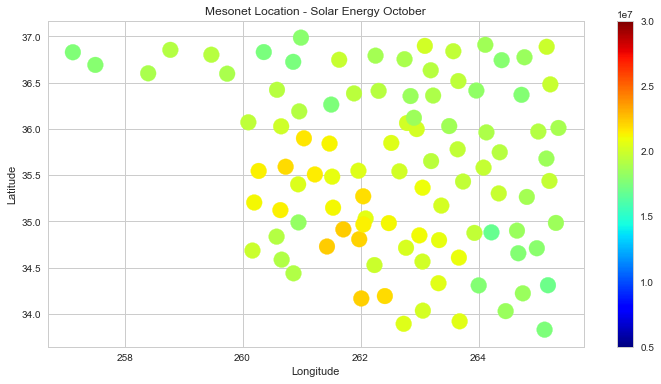

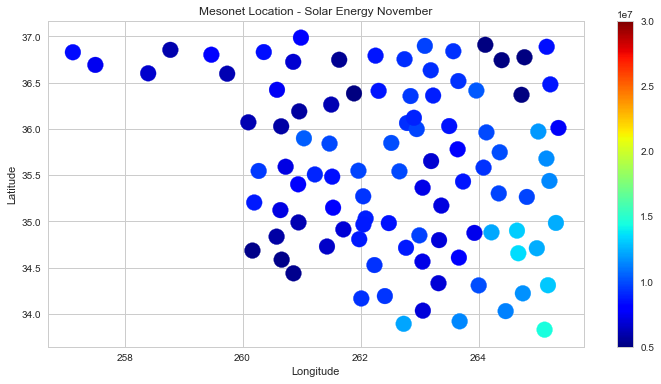

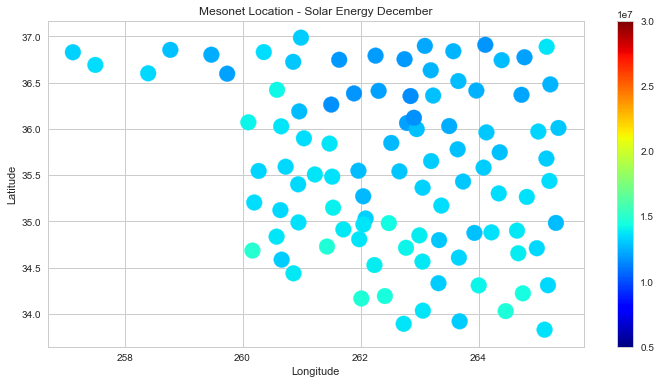

In [932]:
#Lets create some images to see if we can see change over time.  Plan is to stack images to create GIF
time_int = range(2,31*11,30)
date_int = ['January','February','March','April','May','June','July','August','September','October','November','December']
#plot values at a given point in time

for t in range(0,len(time_int)):
    plt.figure(figsize=(12,6))
    plt.scatter(station.longitude, station.latitude, c=gb_train_pca.ix[time_int[t]], s=250, cmap='jet')
    plt.title('Mesonet Location - Solar Energy %s' %date_int[t])
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.colorbar()
    plt.clim(0.5e+07,3e+07)
    plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/gb_train_%s.png' %time_int[t])
    plt.show()

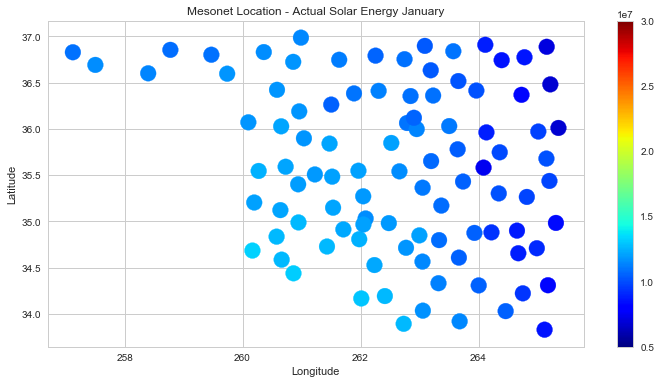

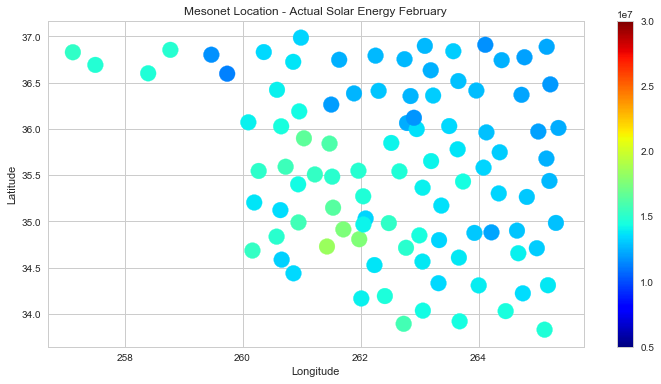

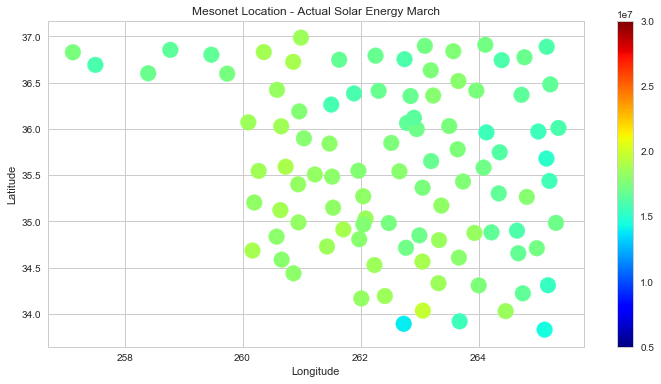

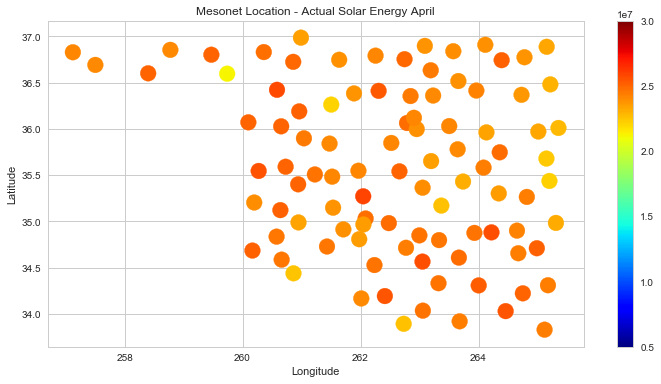

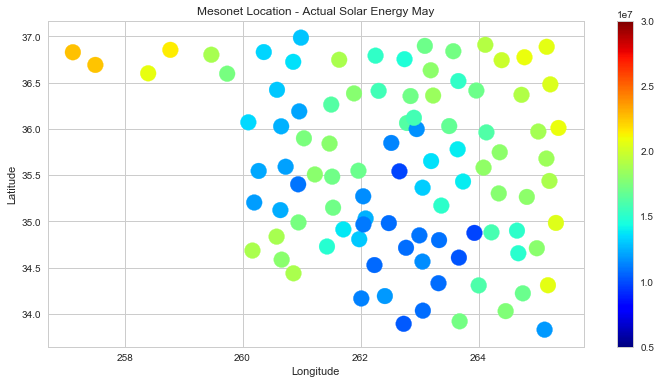

...

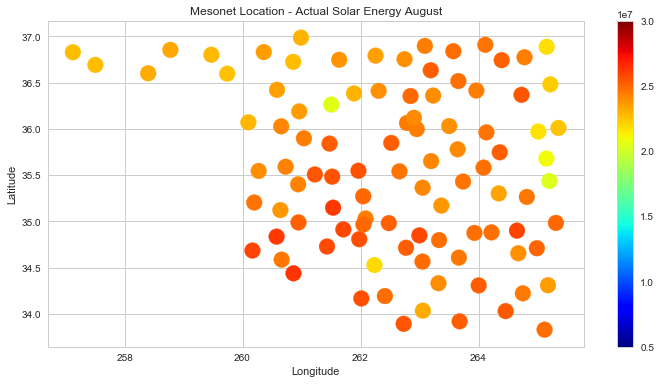

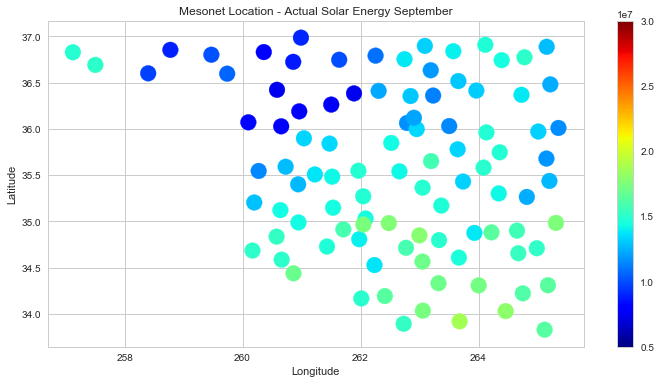

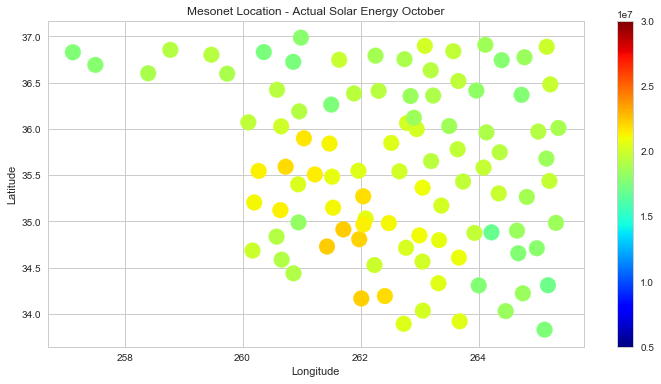

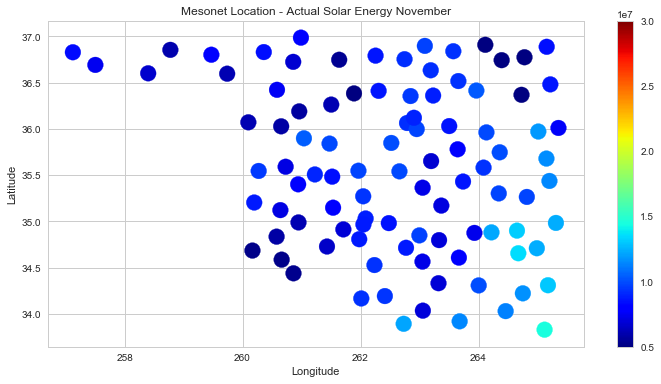

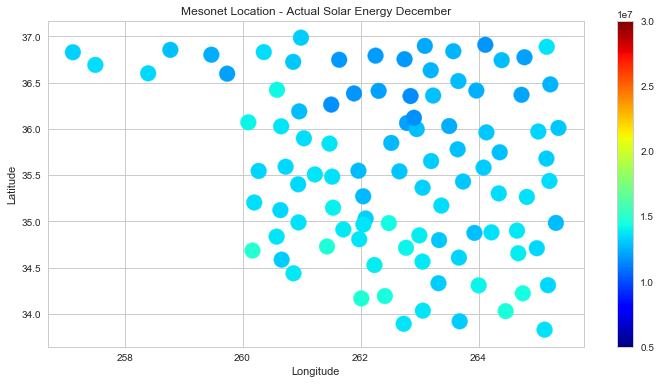

In [933]:
#Lets create some images to see if we can see change over time.  Plan is to stack images to create GIF
time_int = range(2,31*11,30)
date_int = ['January','February','March','April','May','June','July','August','September','October','November','December']
#plot values at a given point in time

for t in range(0,len(time_int)):
    plt.figure(figsize=(12,6))
    plt.scatter(station.longitude, station.latitude, c=gb_train_pca.ix[time_int[t]], s=250, cmap='jet')
    plt.title('Mesonet Location - Actual Solar Energy %s' %date_int[t])
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.colorbar()
    plt.clim(0.5e+07,3e+07)
    plt.savefig('/Users/gopetro/Documents/DSi/Materials/Capstone/part-04/Actual_solar_%s.png' %time_int[t])
    plt.show()

In [940]:
y.BOIS.head()

0    10225200
1    11316600
2    11916000
3    11884200
4     9288900
Name: BOIS, dtype: int64